# **Detección de anomalías en el dataset *Elliptic* por medio de algoritmos de clustering**

> Aplicación del algoritmo de clusterización *k-means* en el dataset de transacciones de Bitcoin *Elliptic*

> Víctor Pérez Cano (victor.perezcano@estudiante.uam.es)

---

## Preparación

### Requisitos

In [1]:
#@title ####Instalación de librerías

!pip install matplotlib
!pip install scikit-learn
!pip install networkx

import torch

!pip install torch_geometric

# Optional dependencies:
if torch.cuda.is_available():
    !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.2.0+cu121.html
else:
    !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.2.0+cpu.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.8 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.2.0+cpu.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 508.1/508.1 kB 38.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 770.0/770.0 kB 58.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.9/213.9 kB 23.4 MB/s eta 0:00:00


In [2]:
#@title #### Imports

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, silhouette_samples, silhouette_score
from sklearn.metrics.cluster import contingency_matrix

In [3]:
#@title #### Montar unidad de Google Drive
from google.colab import drive

drive.mount('/content/gdrive',force_remount=True)
%cd '/content/gdrive/My Drive/Colab Notebooks/TFG Infor'

Mounted at /content/gdrive
/content/gdrive/My Drive/Colab Notebooks/TFG Infor


### Dataset

#### Carga del dataset *Elliptic* (en todos los *time steps*) **con PyTorch Geometric**

In [4]:
from torch_geometric.data import Data
from torch_geometric.datasets import EllipticBitcoinDataset

dataset = EllipticBitcoinDataset('./Datasets/Elliptic_GAD/Atemporal')
data = dataset.get(0)
data

Data(x=[203769, 165], edge_index=[2, 234355], y=[203769], train_mask=[203769], test_mask=[203769])

In [5]:
#@title #### Obtención de tensores

tensor_all_features = data.x
tensor_local_features = tensor_all_features[:, :94]
tensor_test_mask = data.train_mask | data.test_mask
tensor_labels = data.y
print('Full tensor local features shape:', tensor_local_features.shape)
print('Full tensor local + aggregated features shape:', tensor_all_features.shape)
print('Test mask tensor shape: ', tensor_test_mask.shape)
print('Labels tensor shape: ', tensor_labels.shape)

Full tensor local features shape: torch.Size([203769, 94])
Full tensor local + aggregated features shape: torch.Size([203769, 165])
Test mask tensor shape:  torch.Size([203769])
Labels tensor shape:  torch.Size([203769])


In [6]:
#@title #### Convertir todo a arrays de numpy

all_features = tensor_all_features.numpy()
local_features = tensor_local_features.numpy()
test_mask = tensor_test_mask.numpy()
labels = tensor_labels.numpy()

test_labels = labels[test_mask]
print(f'All labels shape:\t{labels.shape[0]},\t unique values: {np.unique(labels)}')
print(f'Test labels shape:\t{test_labels.shape[0]},\t unique values: {np.unique(test_labels)}')

All labels shape:	203769,	 unique values: [0 1 2]
Test labels shape:	46564,	 unique values: [0 1]


---
# Versión preeliminar

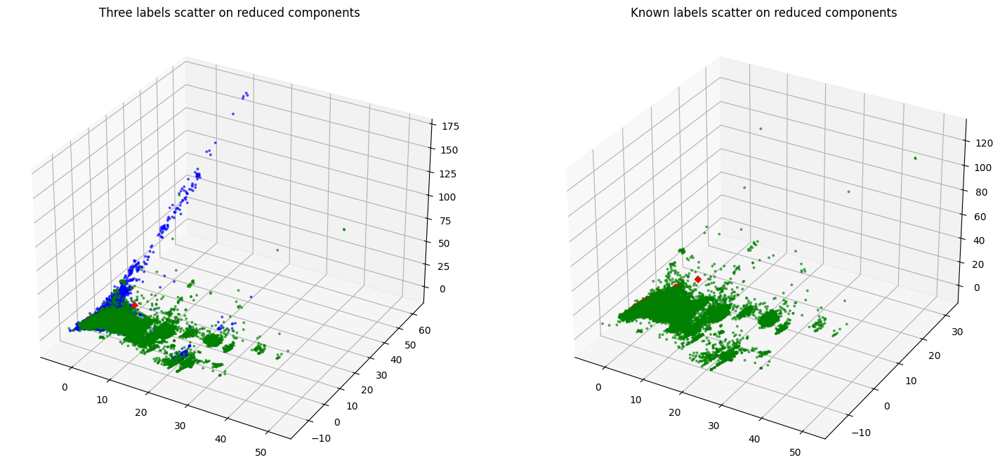

In [ ]:
#@title #### Scatter sobre espacio reducido a 3 dimensiones mediante PCA

def plot_reduced_scatter(features_mat):
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features_mat)
    pca = PCA(n_components=3)
    pca.fit(features_scaled)
    features_reduced = pca.transform(features_scaled)

    fig = plt.figure(figsize=(18,10))
    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')

    ax1.set_title('Three labels scatter on reduced components')
    #ax1.set_xlabel("Reduced feature space for the 1st feature")
    #ax1.set_ylabel("Reduced feature space for the 2nd feature")
    #ax1.set_xlabel("Reduced feature space for the 3nd feature")
    ax1.scatter(features_reduced[labels==0][:, 0], features_reduced[labels==0][:, 1], features_reduced[labels==0][:, 2], marker='.', s=30, lw=0, alpha=0.7, c='green', edgecolor="k")
    ax1.scatter(features_reduced[labels==1][:, 0], features_reduced[labels==1][:, 1], features_reduced[labels==1][:, 2], marker='D', s=30, lw=0, alpha=1, c='red', edgecolor="k")
    ax1.scatter(features_reduced[labels==2][:, 0], features_reduced[labels==2][:, 1], features_reduced[labels==2][:, 2], marker='.', s=30, lw=0, alpha=0.7, c='blue', edgecolor="k")

    ax2.scatter(features_reduced[labels==0][:, 0], features_reduced[labels==0][:, 1], features_reduced[labels==0][:, 2], marker='.', s=30, lw=0, alpha=0.7, c='green', edgecolor="k")
    ax2.scatter(features_reduced[labels==1][:, 0], features_reduced[labels==1][:, 1], features_reduced[labels==1][:, 2], marker='D', s=30, lw=0, alpha=1, c='red', edgecolor="k")
    ax2.set_title('Known labels scatter on reduced components')
    #ax2.set_xlabel("Reduced feature space for the 1st feature")
    #ax2.set_ylabel("Reduced feature space for the 2nd feature")
    #ax2.set_xlabel("Reduced feature space for the 3nd feature")
    plt.grid()
    plt.show()

plot_reduced_scatter(all_features)

## **K-means sobre todos los features**


In [ ]:
#@title ### Definir ```batch_size``` óptimo y otros parámetros

import multiprocessing

cores = multiprocessing.cpu_count()
batch_size = cores*256
print(f'Number of cores: {cores}\nUsing batch_size: {batch_size}')

kmeans_params = {
    'n_init': 20,
    'max_iter': 2000,
    'batch_size': batch_size,
    'reassignment_ratio': 0.05
}


Number of cores: 16
Using batch_size: 4096


In [ ]:
#@title ### Definiciones para $k$ genérica

def compute_and_eval_kmeans(k: int, features, **kwargs):

    fig = plt.figure(figsize=(18,10))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')

    ax1.set_xlim([-0.2, 1])
    ax1.set_ylim([0, len(features) + (k + 1) * 10])

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    kmeans = MiniBatchKMeans(n_clusters=k, **kwargs)
    kmeans.fit(features_scaled)

    predicted_labels = kmeans.predict(features_scaled)
    silhouette_avg = silhouette_score(features_scaled, predicted_labels)
    sample_silhouette_values = silhouette_samples(features_scaled, predicted_labels)
    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[predicted_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / k)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  # 10 for the 0 samples
    ax1.set_title(f"Diagrama de silueta para k={k} clusters")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.2, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    pca = PCA(n_components=3)
    pca.fit(features_scaled)
    features_reduced = pca.transform(features_scaled)
    colors = cm.nipy_spectral(predicted_labels.astype(float) / k)
    ax2.scatter(
        features_reduced[:, 0], features_reduced[:, 1], features_reduced[:, 2], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )
    centers = kmeans.cluster_centers_
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")
    ax2.set_title("Visualización de los datos en clusters")
    #ax2.set_xlabel("Feature space for the 1st feature")
    #ax2.set_ylabel("Feature space for the 2nd feature")
    #ax2.set_zlabel("Feature space for the 3nd feature")

    plt.suptitle(
        "Análisis de silueta para KMeans con k = %d"
        % k,
        fontsize=14,
        fontweight="bold",
    )

    plt.show()
    return silhouette_avg, predicted_labels, fig


def plot_contingency_matrix(k, predicted_labels, color_map='YlGnBu') -> None:
    plt.figure(figsize=(18,12))
    cont_mat = contingency_matrix(labels[test_mask], predicted_labels[test_mask])
    reordered_idx = np.argsort(-cont_mat[0])
    cont_mat = cont_mat[:, reordered_idx]
    sns.heatmap(cont_mat, annot=True, fmt='d', cmap=color_map,
                xticklabels=[f'Cluster {i}' for i in reordered_idx],
                yticklabels=['Lícito', 'Ilícito'])
    plt.title(f'Matriz de contingencia para k={k}')
    plt.xlabel('Clusters')
    plt.ylabel('Labels')

    plt.show()


### Diagramas de silueta para varios valores de $k$

  0%|          | 0/7 [00:00<?, ?it/s]

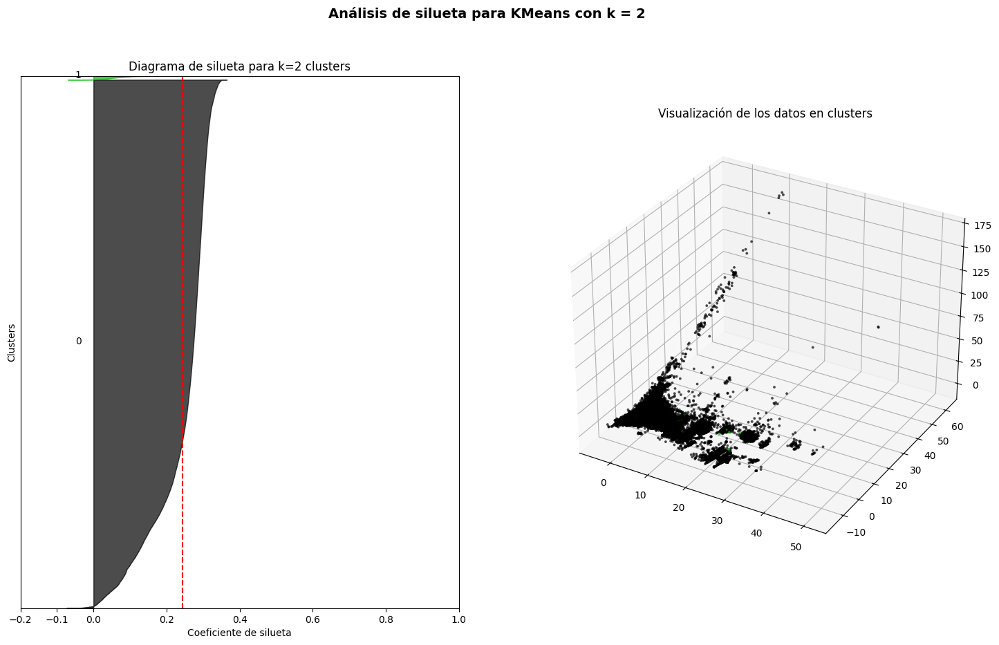

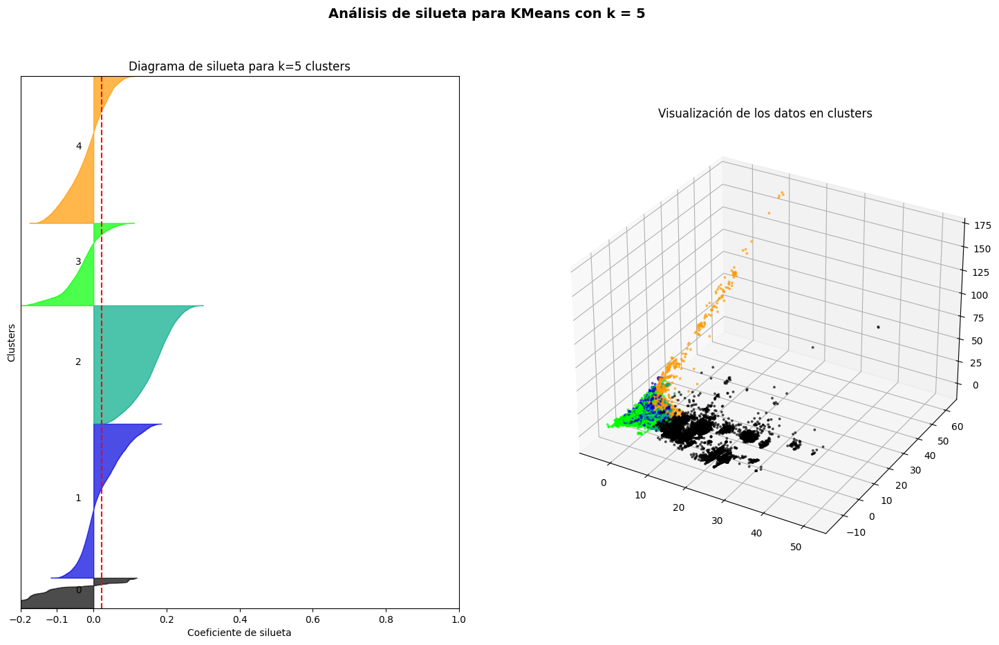

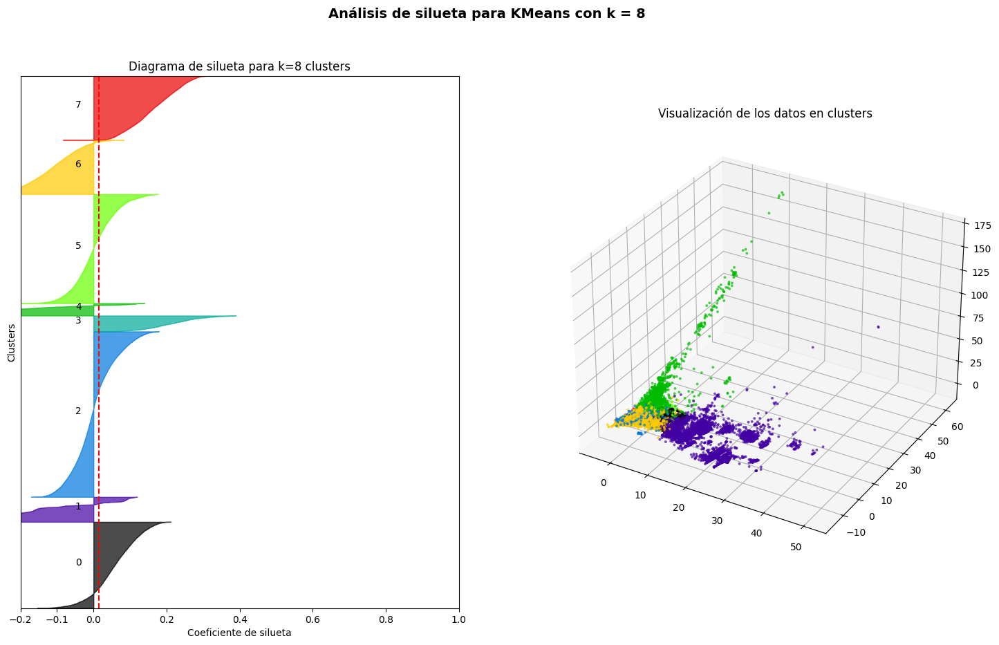

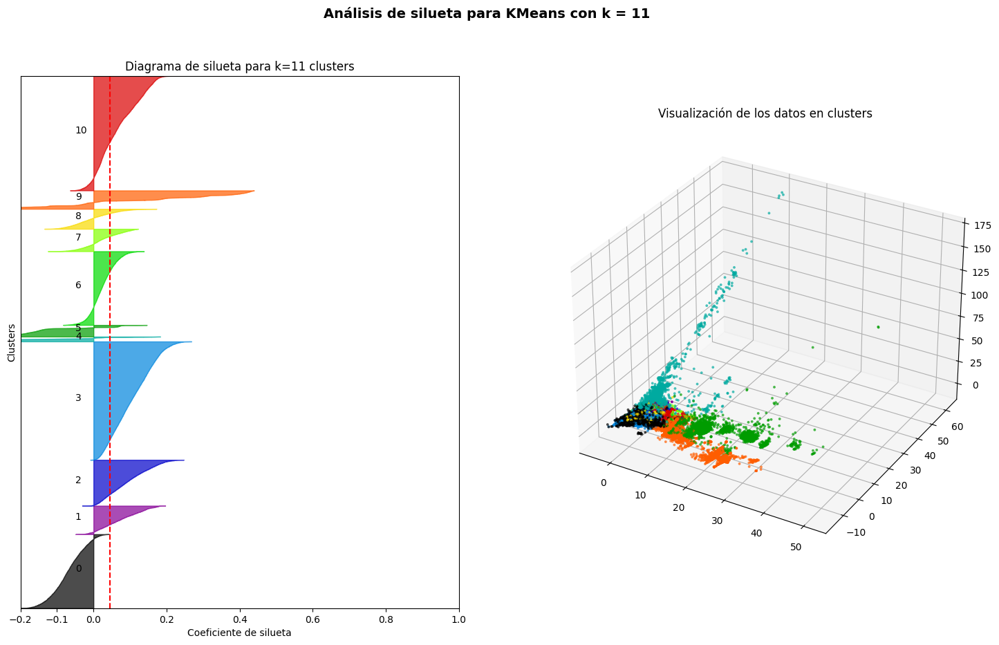

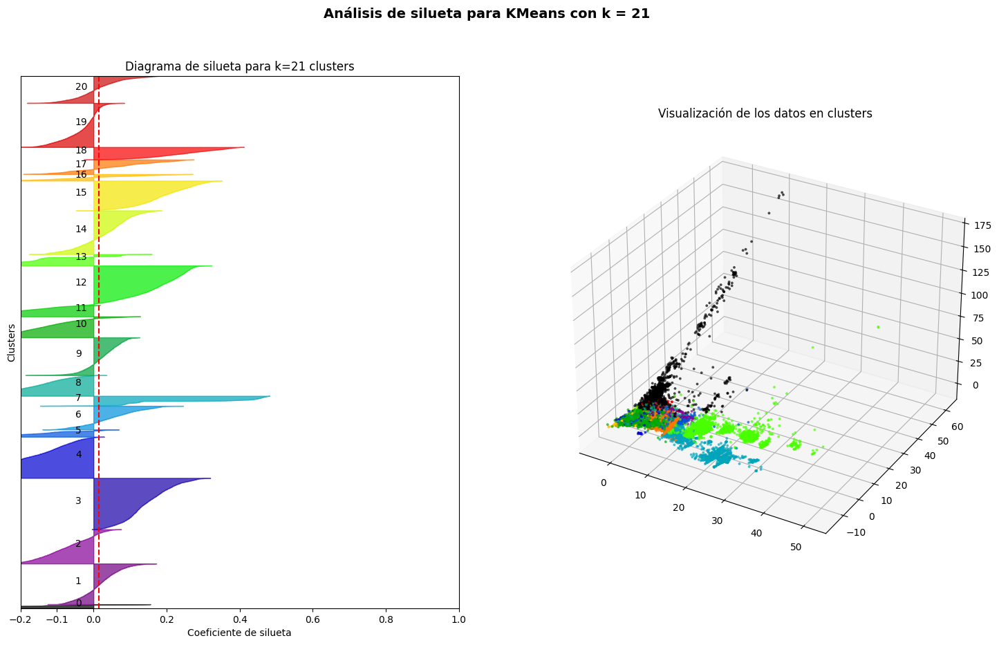

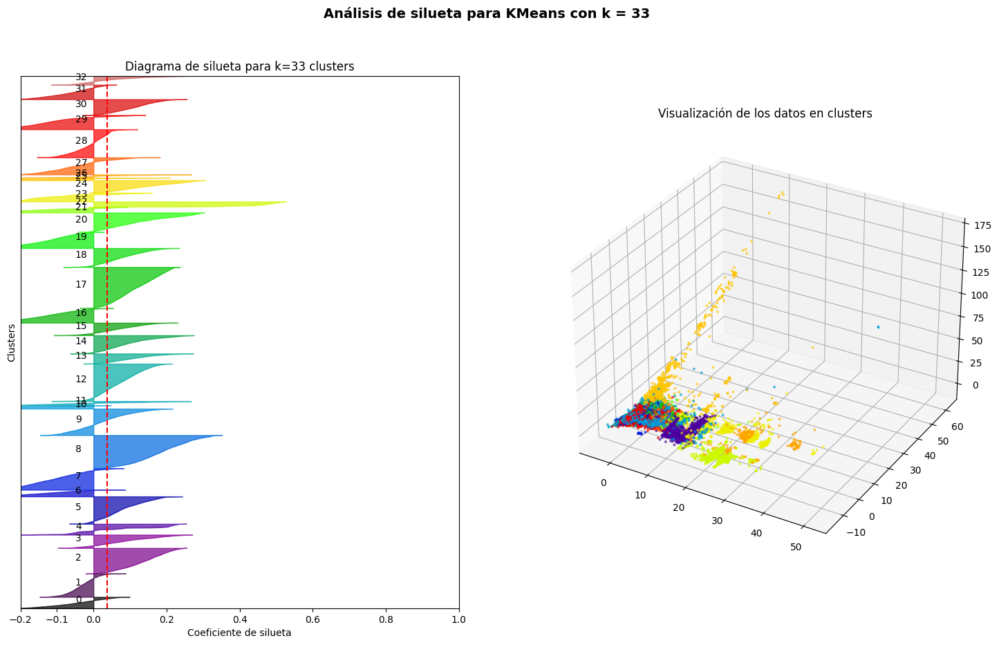

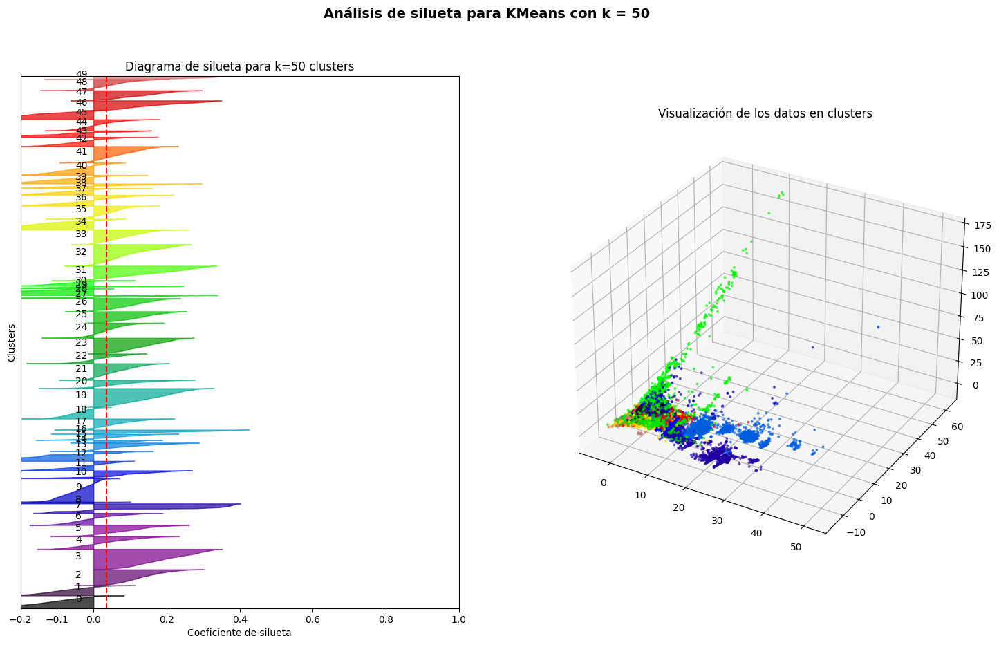

In [ ]:
silhouette_values = dict()
predicted_cluster_labels = dict()
plots = dict()

test_k = [2,5,8,11,21,33,50]

for k in tqdm(test_k):
    sv, pl, fig = compute_and_eval_kmeans(k, all_features, **kmeans_params)
    silhouette_values[k] = sv
    predicted_cluster_labels[k] = pl
    plots[k] = fig

### Resultados y matrices de contingencia

In [ ]:

silhouette_values

{2: 0.24433166,
 5: 0.022652488,
 8: 0.014501713,
 11: 0.04432438,
 21: 0.013920896,
 33: 0.037608977,
 50: 0.035291985}

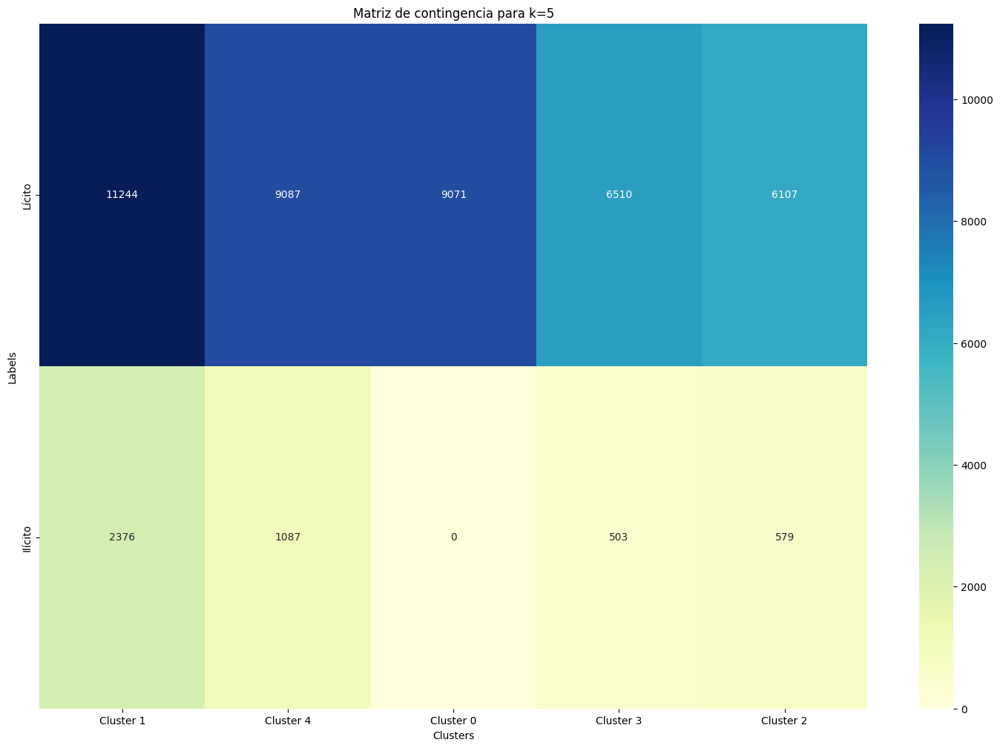

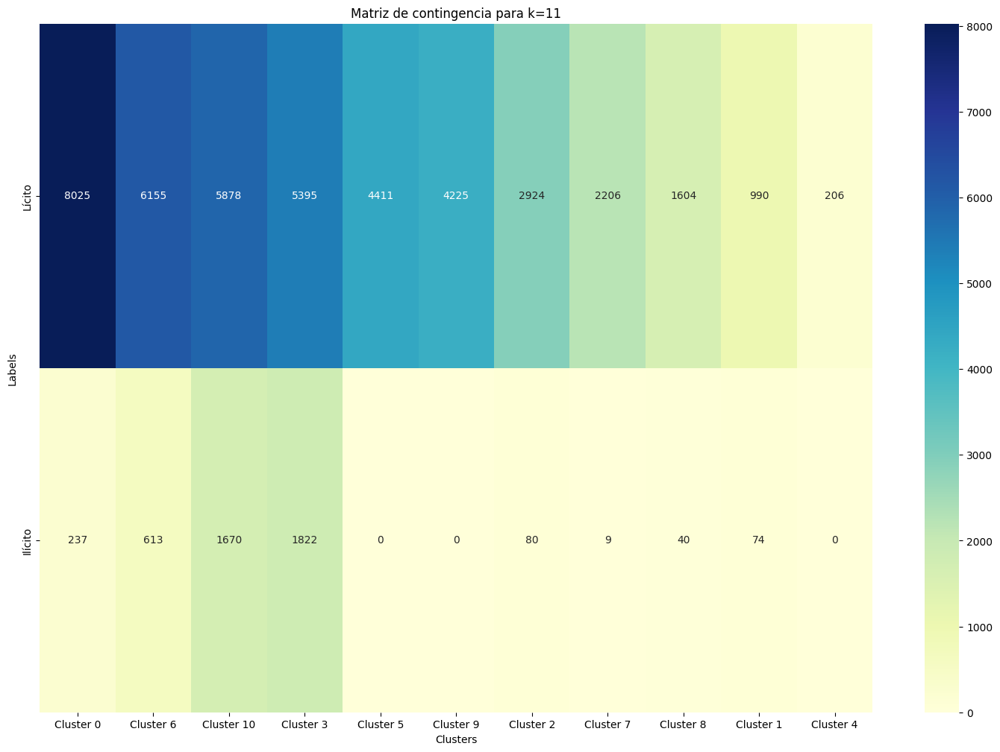

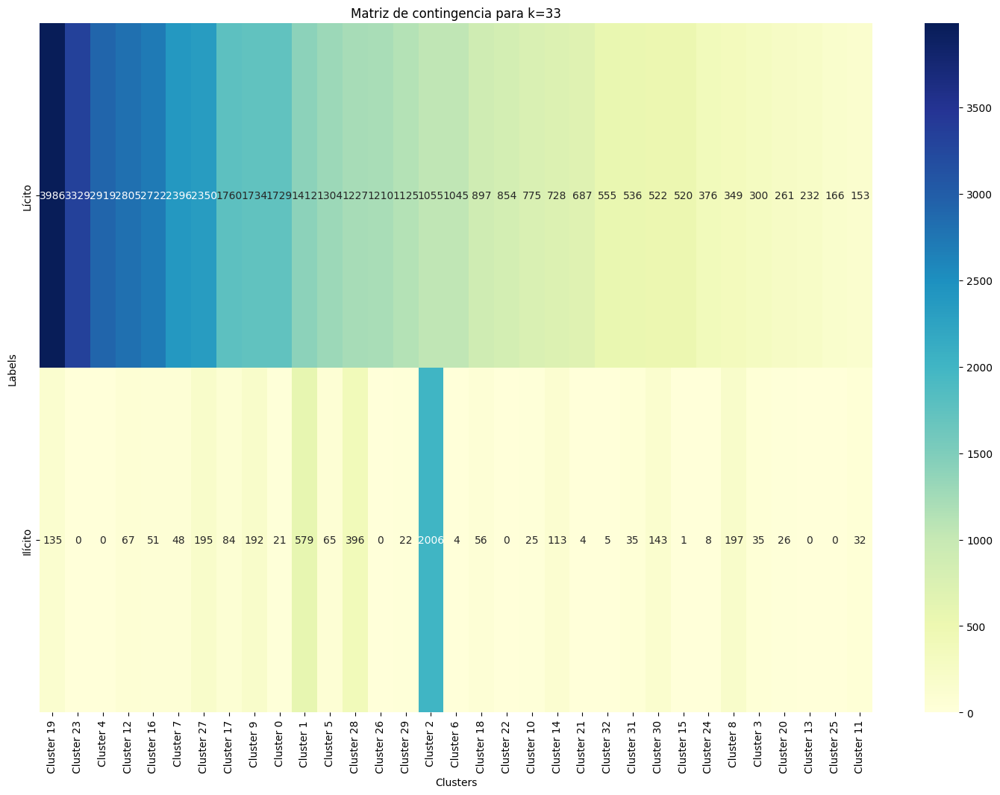

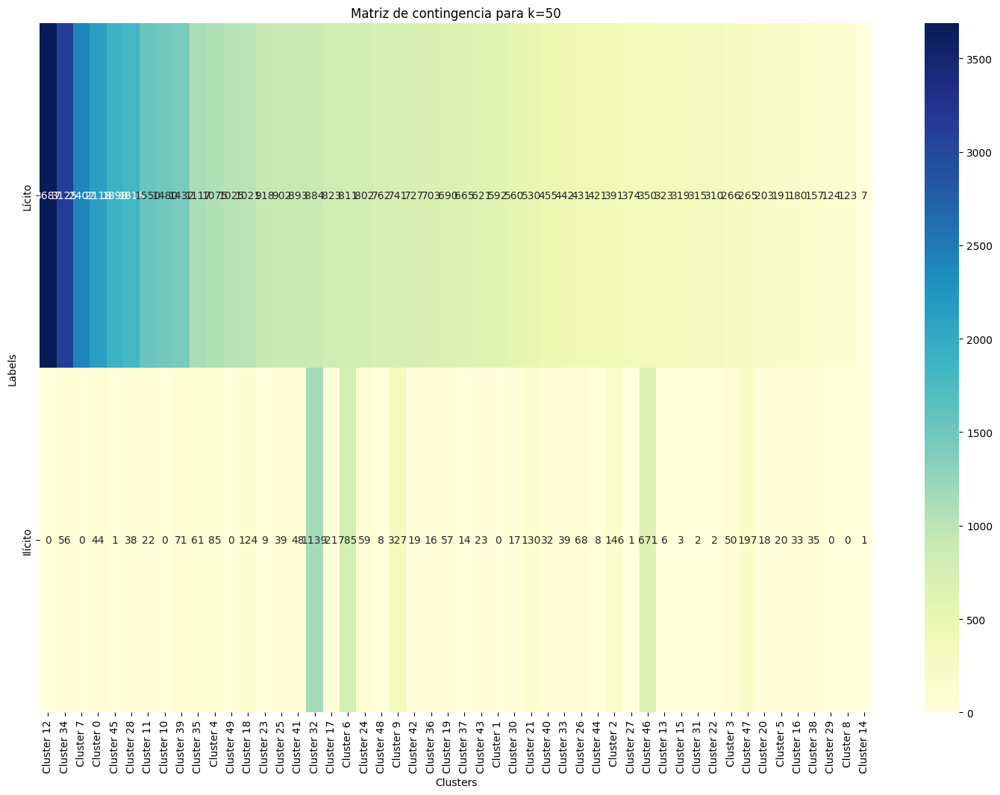

In [ ]:
for k in [5,11,33,50]:
    plot_contingency_matrix(k, predicted_cluster_labels[k])

## **K-means sobre features + *embeddings***

### Obtención de embeddings

In [ ]:
from torch_geometric.nn import Node2Vec

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = Node2Vec(
    data.edge_index,
    embedding_dim=128,
    walk_length=20,
    context_size=10,
    walks_per_node=10,
    num_negative_samples=1,
    p=1.0,
    q=1.0,
    sparse=True,
).to(device)

In [ ]:
# Eliminar warnings incomodos
import warnings
warnings.filterwarnings('ignore')


In [ ]:

loader = model.loader(batch_size=2048, shuffle=True, num_workers=8)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)


@torch.no_grad()
def test():
    model.eval()
    z = model()
    acc = model.test(
        train_z=z[data.train_mask],
        train_y=data.y[data.train_mask],
        test_z=z[data.test_mask],
        test_y=data.y[data.test_mask],
        max_iter=100,
    )
    return acc


for epoch in tqdm(range(1, 101)):
    loss = train()
    acc = test()
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}, Acc: {acc:.4f}')
z = model()
embeddings_tensor = z.detach().cpu()
embeddings_tensor.shape


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 001, Loss: 5.3293, Acc: 0.9350
Epoch: 002, Loss: 3.4945, Acc: 0.9350
Epoch: 003, Loss: 2.4067, Acc: 0.9350
Epoch: 004, Loss: 1.7301, Acc: 0.9350
Epoch: 005, Loss: 1.3181, Acc: 0.9350
Epoch: 006, Loss: 1.0784, Acc: 0.9350
Epoch: 007, Loss: 0.9436, Acc: 0.9350
Epoch: 008, Loss: 0.8672, Acc: 0.9350
Epoch: 009, Loss: 0.8214, Acc: 0.9349
Epoch: 010, Loss: 0.7923, Acc: 0.9349
Epoch: 011, Loss: 0.7730, Acc: 0.9348
Epoch: 012, Loss: 0.7595, Acc: 0.9347
Epoch: 013, Loss: 0.7498, Acc: 0.9344
Epoch: 014, Loss: 0.7425, Acc: 0.9344
Epoch: 015, Loss: 0.7370, Acc: 0.9341
Epoch: 016, Loss: 0.7327, Acc: 0.9340
Epoch: 017, Loss: 0.7294, Acc: 0.9340
Epoch: 018, Loss: 0.7267, Acc: 0.9336
Epoch: 019, Loss: 0.7245, Acc: 0.9335
Epoch: 020, Loss: 0.7227, Acc: 0.9332
Epoch: 021, Loss: 0.7213, Acc: 0.9331
Epoch: 022, Loss: 0.7201, Acc: 0.9333
Epoch: 023, Loss: 0.7191, Acc: 0.9331
Epoch: 024, Loss: 0.7183, Acc: 0.9334
Epoch: 025, Loss: 0.7176, Acc: 0.9331
Epoch: 026, Loss: 0.7170, Acc: 0.9331
Epoch: 027, 

torch.Size([203769, 128])

In [ ]:
#@title #### Exporto los embeddings a un CSV

embeddings_np = embeddings_tensor.numpy()
embeddings_df = pd.DataFrame(embeddings_np)
embeddings_df.to_csv('Datasets/Elliptic_GAD/embeddings.csv')

In [ ]:
feat_plus_emb = np.concatenate((all_features, embeddings_np), axis=1)
feat_plus_emb.shape

(203769, 293)

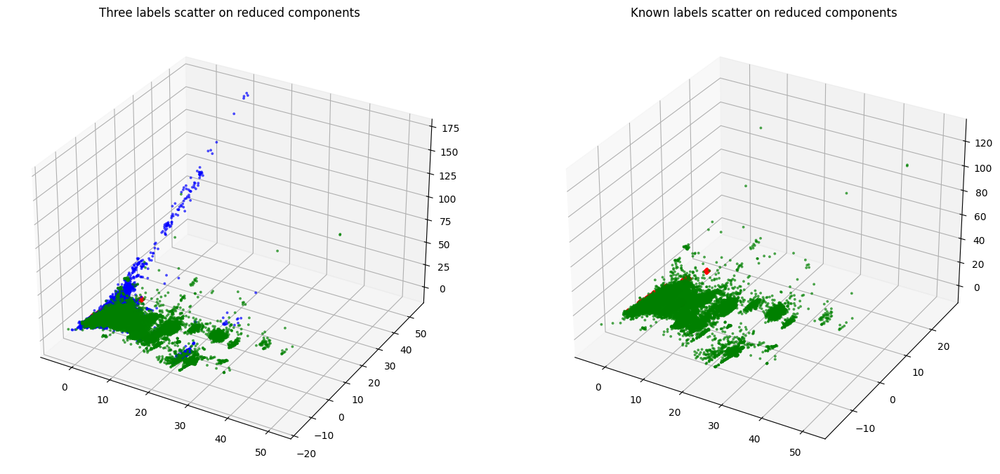

In [ ]:
#@title #### Visualización de las features + embeddings

plot_reduced_scatter(feat_plus_emb)

### Diagramas de silueta para varios valores de $k$

  0%|          | 0/7 [00:00<?, ?it/s]

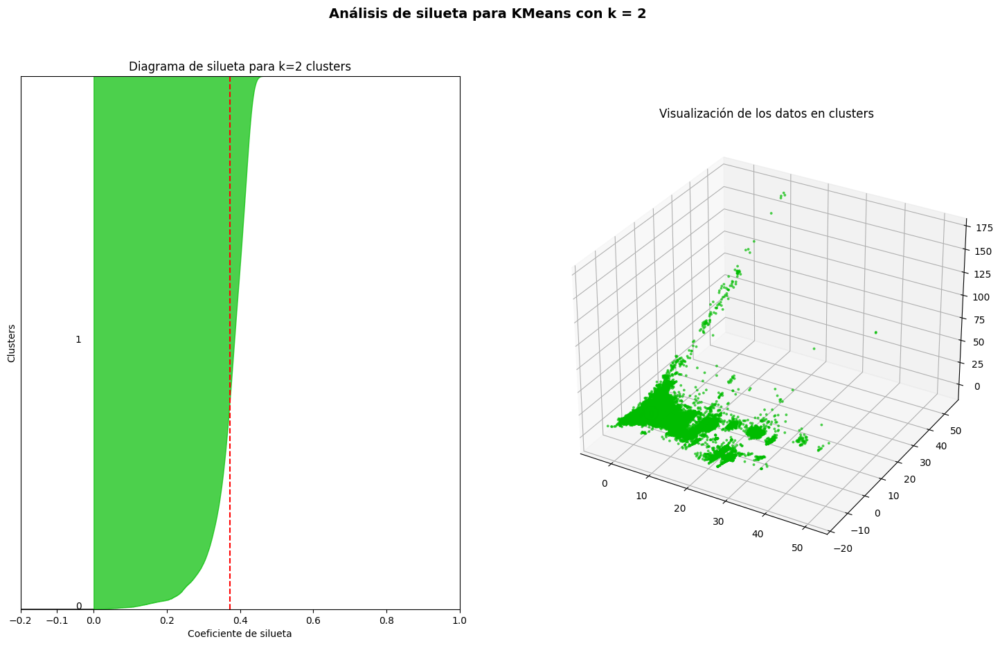

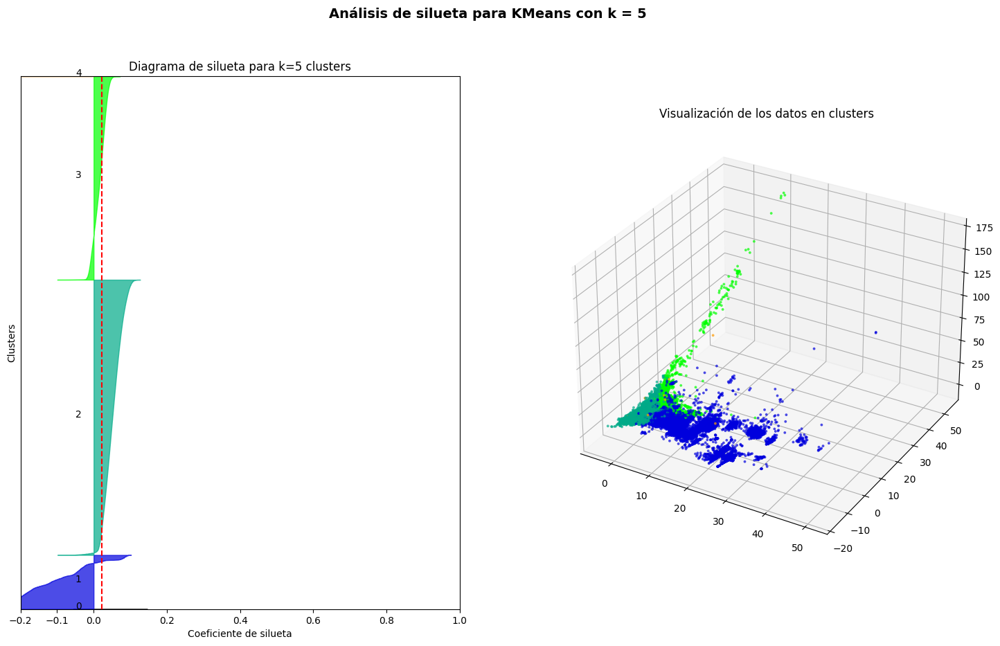

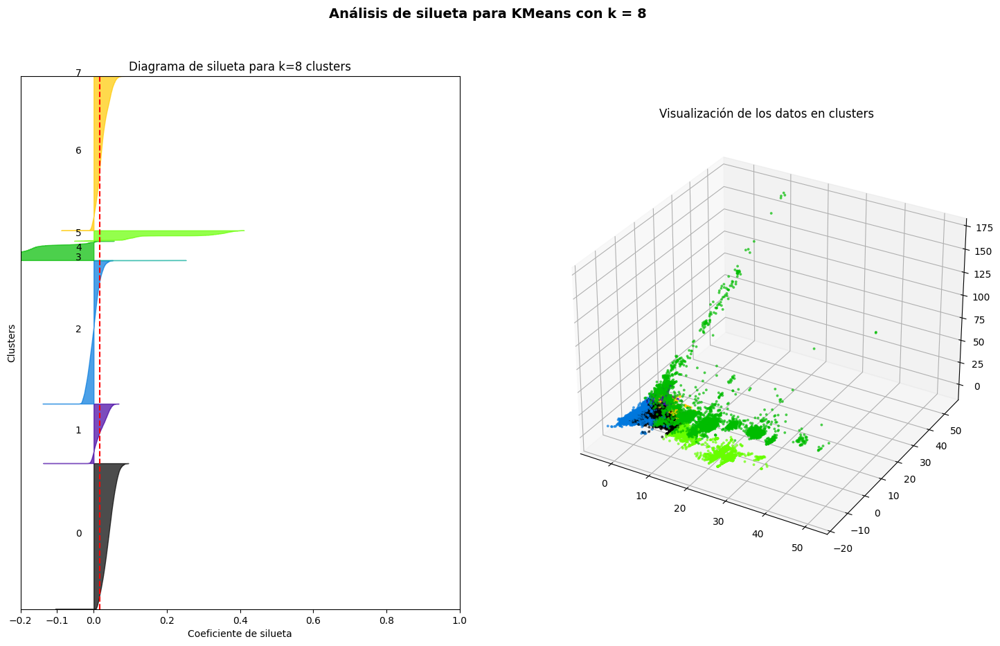

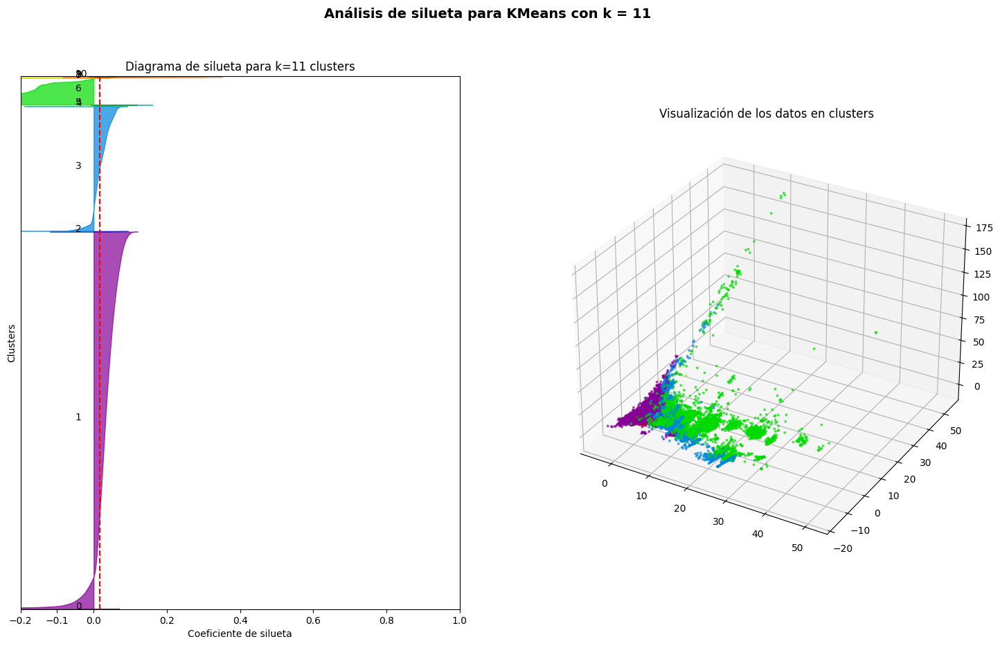

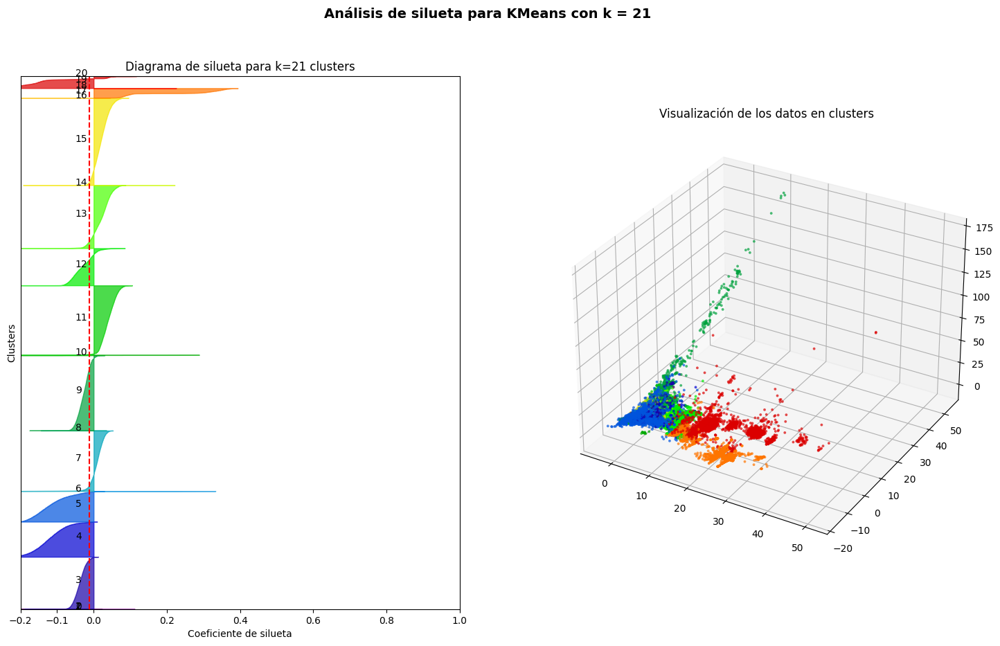

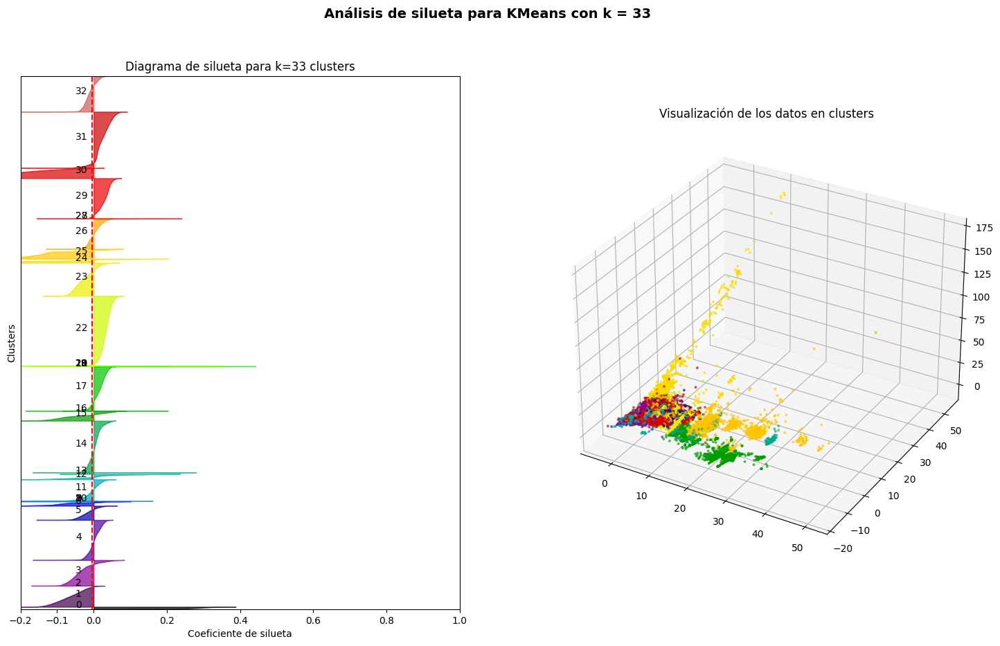

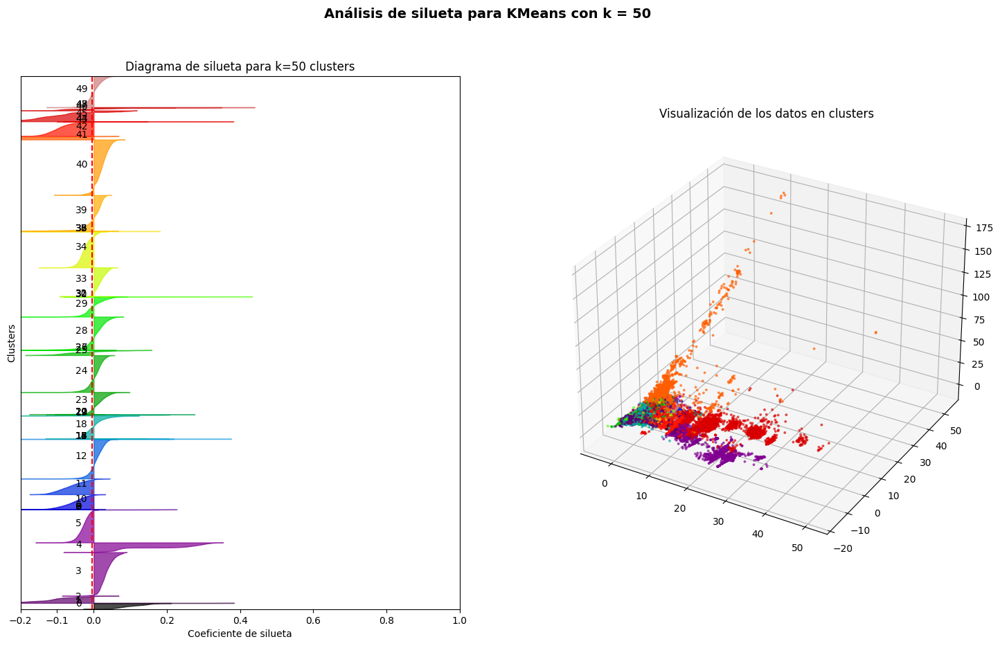

In [ ]:
emb_silhouette_values = dict()
emb_predicted_cluster_labels = dict()
emb_plots = dict()

test_k = [2,5,8,11,21,33,50]

for k in tqdm(test_k):
    sv, pl, fig = compute_and_eval_kmeans(k, feat_plus_emb, **kmeans_params)
    emb_silhouette_values[k] = sv
    emb_predicted_cluster_labels[k] = pl
    emb_plots[k] = fig

### Resultados y matrices de contingencia

In [ ]:

emb_silhouette_values

{2: 0.37280014,
 5: 0.022014841,
 8: 0.016673202,
 11: 0.017451143,
 21: -0.0119601805,
 33: -0.004182218,
 50: -0.003504824}

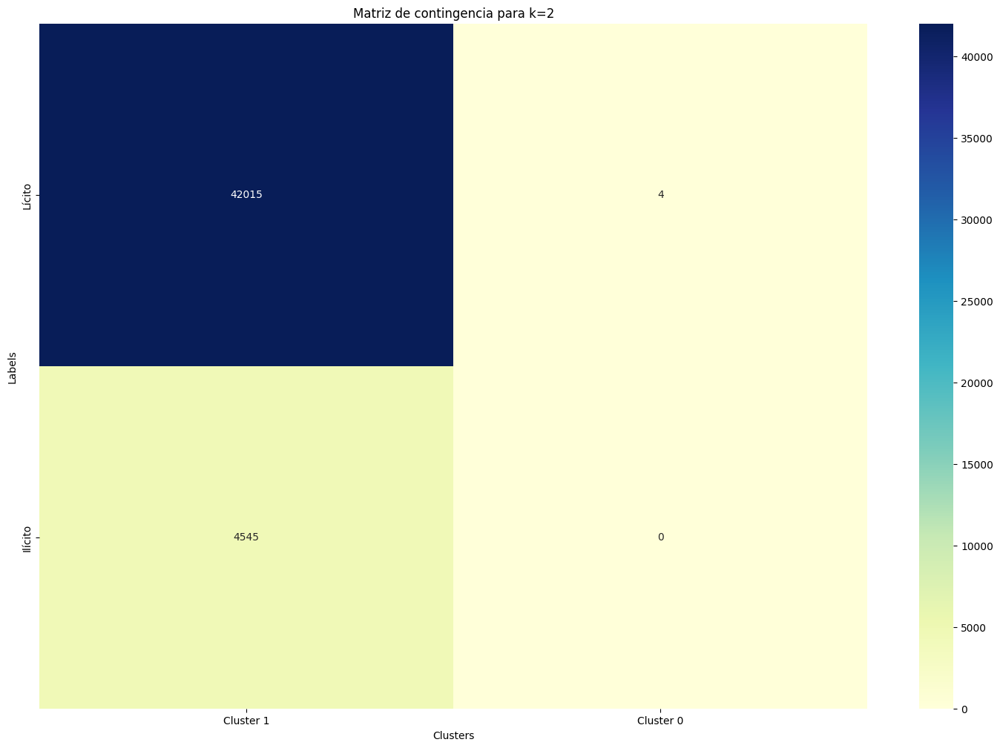

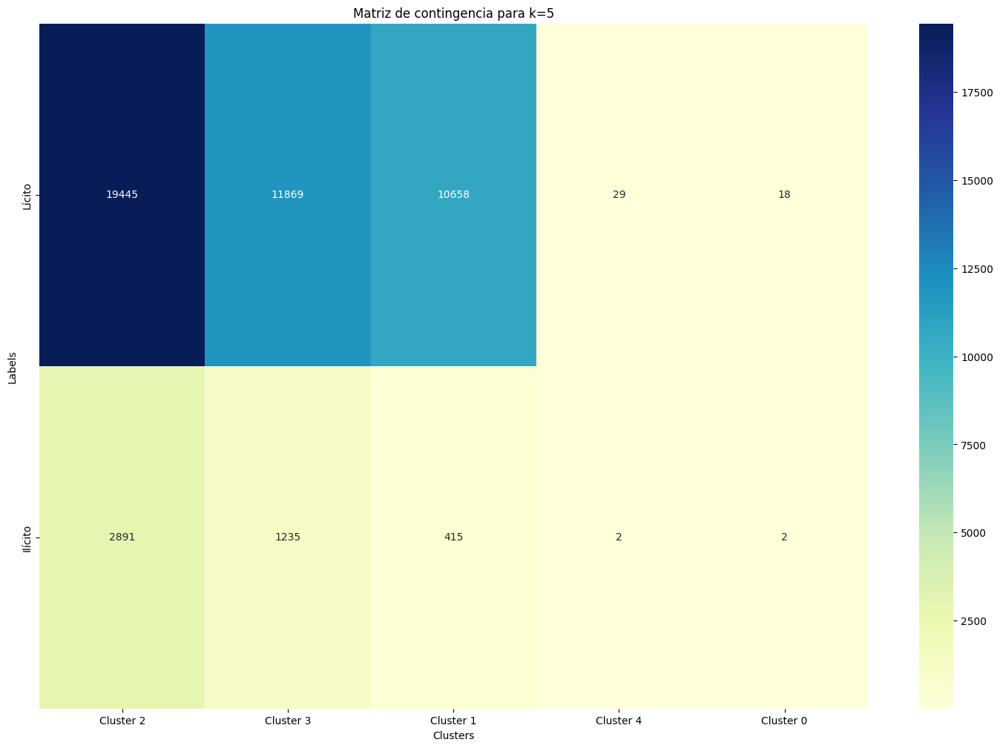

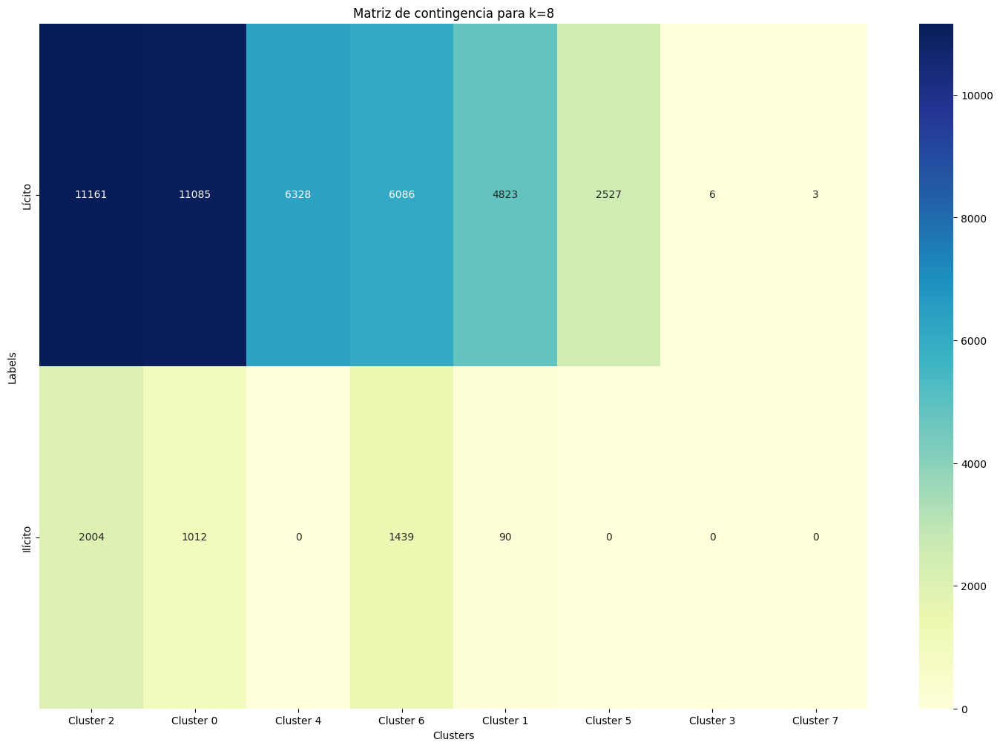

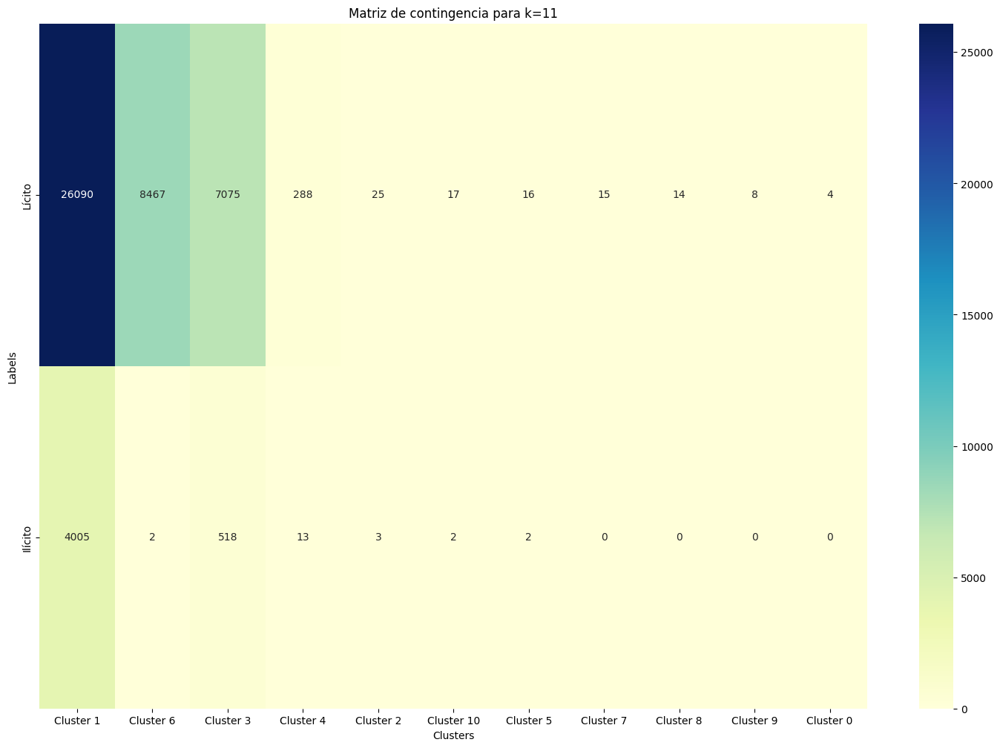

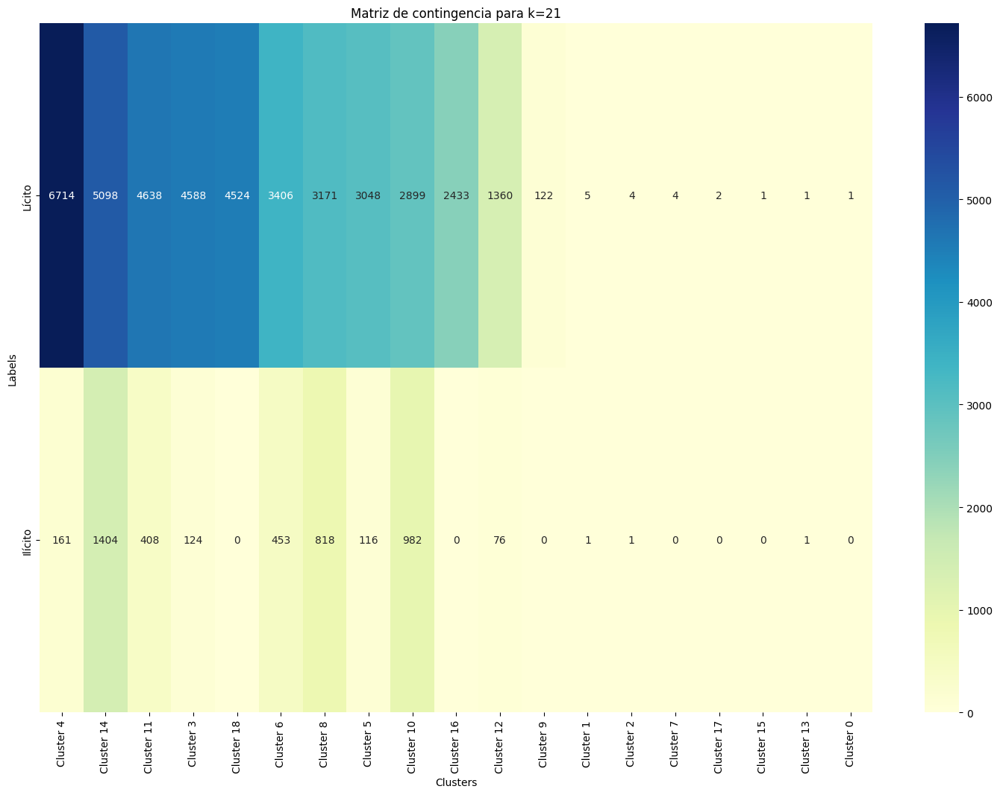

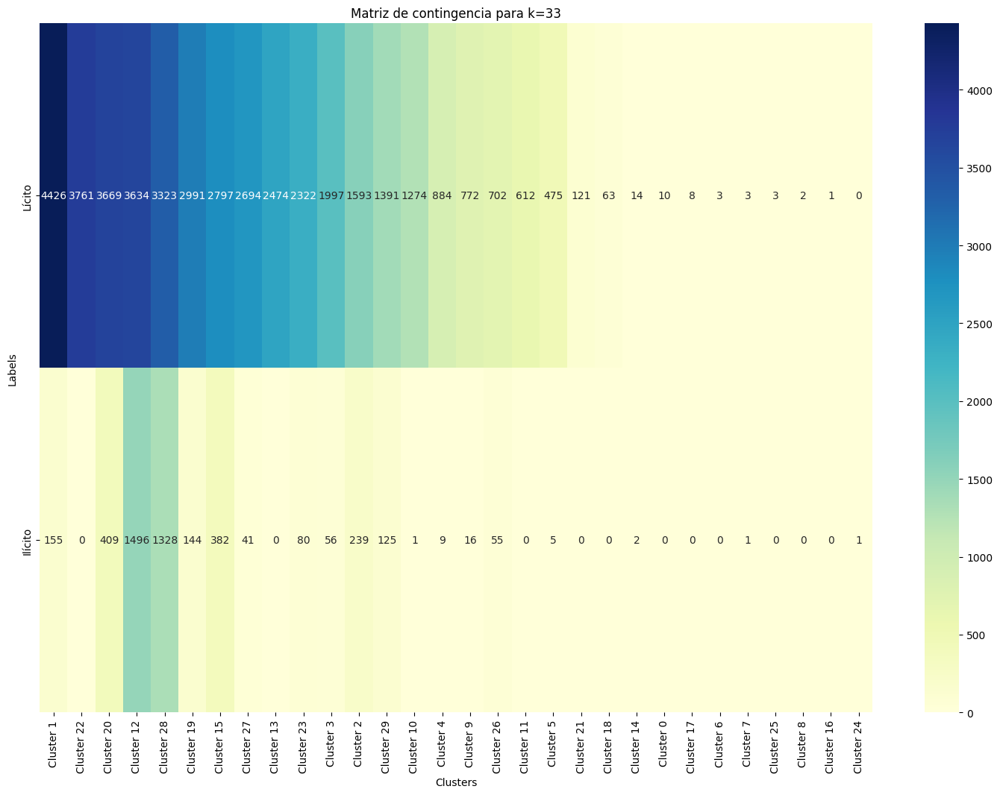

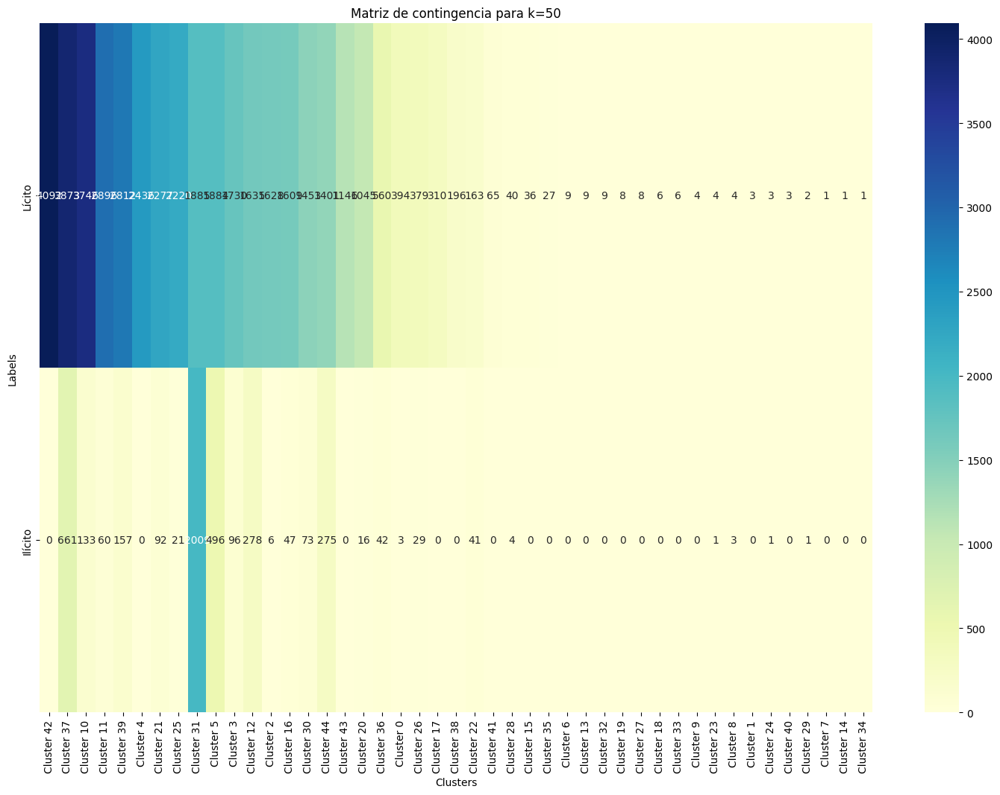

In [ ]:
for k in test_k:
    plot_contingency_matrix(k, emb_predicted_cluster_labels[k])

---
# Versión final para exportar

## Previo

In [7]:

rs = 33
sns.set(style="darkgrid", context="paper")   # Estilo usado salvo para los plots en 3d
!mkdir -p ./Plots/Clustering/

### Obtención de una representación reducida de las transacciones para su posterior visualización

#### Con t-SNE

##### Obtención de las representaciones mediante t-SNE (~6h)

In [ ]:

tsne = TSNE(n_components=3, random_state=rs, n_jobs=-1)
tsne_reduced_features = tsne.fit_transform(all_features)


In [ ]:
np.savetxt('./Datasets/Elliptic Bitcoin Dataset/tsne_reduced_features.csv', tsne_reduced_features, delimiter=',')

##### Cargar las representaciones desde un CSV

In [ ]:
tsne_reduced_features = np.loadtxt('./Datasets/Elliptic Bitcoin Dataset/tsne_reduced_features.csv', delimiter=',')


####  Visualización

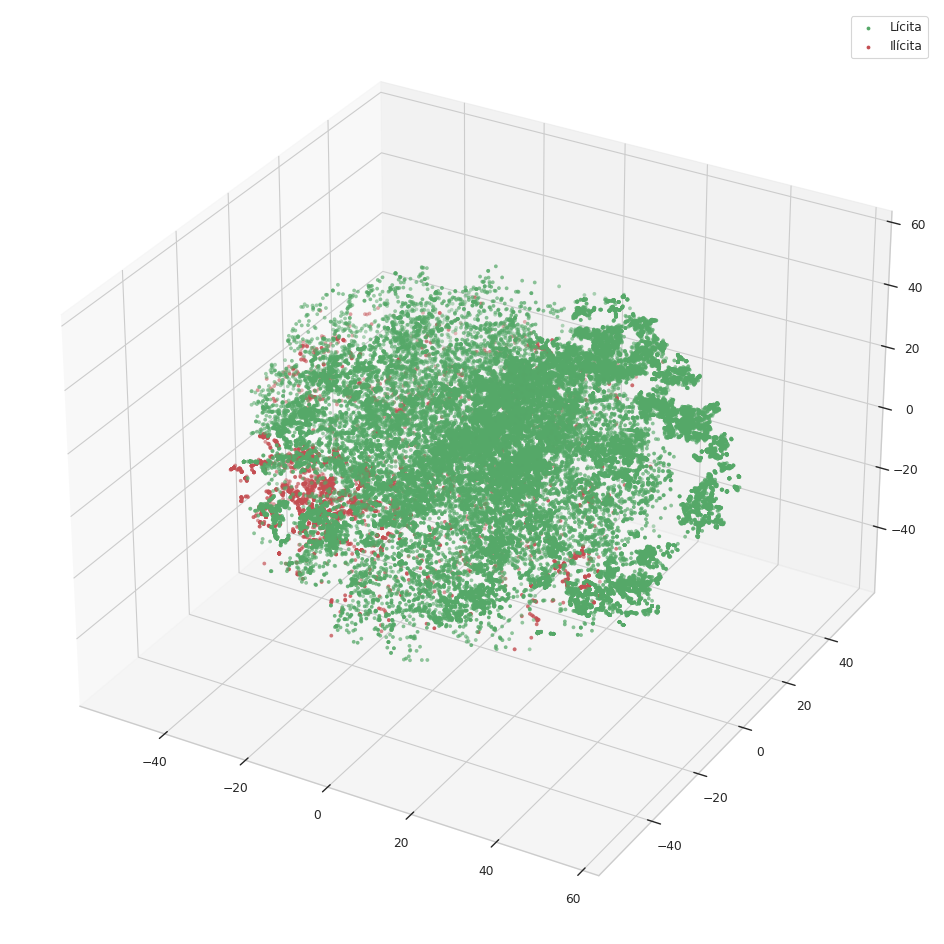

In [ ]:
with sns.axes_style("whitegrid"):
    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(tsne_reduced_features[np.where(labels == 0), 0], tsne_reduced_features[np.where(labels == 0), 1], tsne_reduced_features[np.where(labels == 0), 2], marker='.', s=30, lw=0, edgecolor='k', color='g', label='Lícita')
    ax.scatter(tsne_reduced_features[np.where(labels == 1), 0], tsne_reduced_features[np.where(labels == 1), 1], tsne_reduced_features[np.where(labels == 1), 2], marker='.', s=30, lw=0, edgecolor='k', color='r', label='Ilícita')
    #ax.scatter(tsne_reduced_features[np.where(labels == 2), 0], tsne_reduced_features[np.where(labels == 2), 1], tsne_reduced_features[np.where(labels == 2), 2], marker='.', s=30, lw=0, edgecolor='k', color='orange', label='Desconocida')
    ax.legend()
    plt.show()
    plt.close()


#### Con PCA

In [ ]:

pca = PCA(n_components=165, random_state=rs)
pca_reduced_features = pca.fit_transform(all_features)


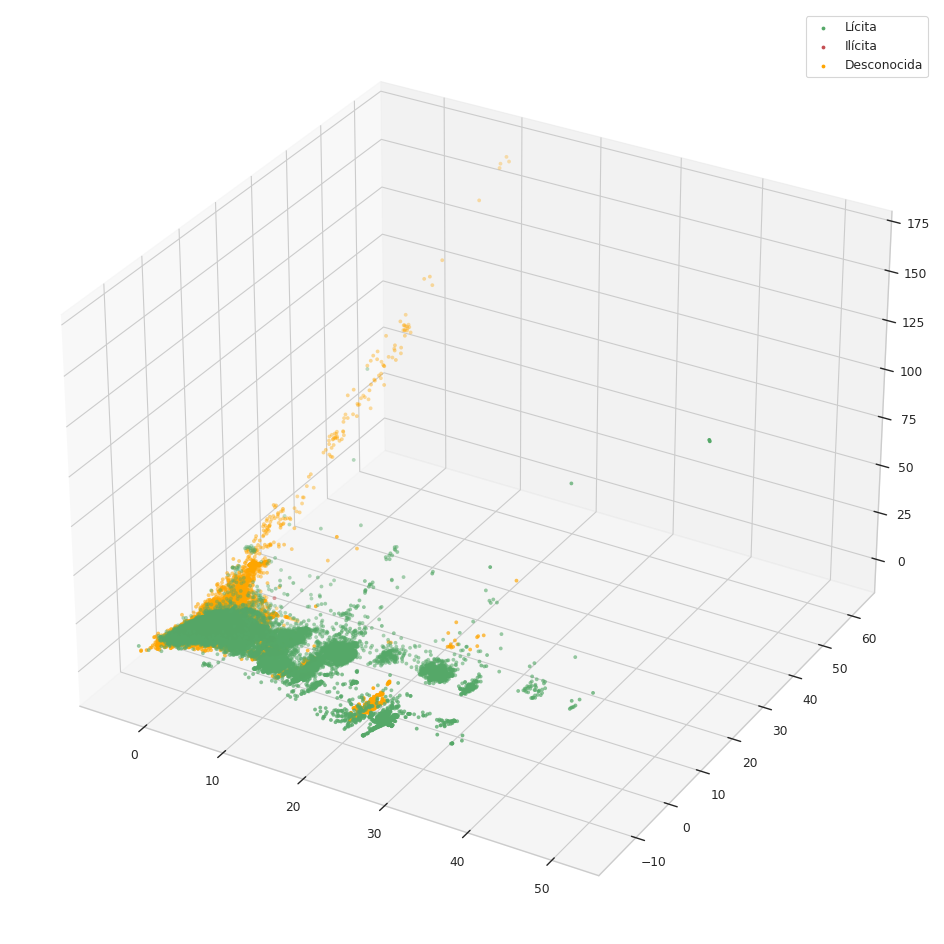

In [ ]:
with sns.axes_style("whitegrid"):
    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(pca_reduced_features[np.where(labels == 0), 0], pca_reduced_features[np.where(labels == 0), 1], pca_reduced_features[np.where(labels == 0), 2], marker='.', s=30, lw=0, edgecolor='k', color='g', label='Lícita')
    ax.scatter(pca_reduced_features[np.where(labels == 1), 0], pca_reduced_features[np.where(labels == 1), 1], pca_reduced_features[np.where(labels == 1), 2], marker='.', s=30, lw=0, edgecolor='k', color='r', label='Ilícita')
    ax.scatter(pca_reduced_features[np.where(labels == 2), 0], pca_reduced_features[np.where(labels == 2), 1], pca_reduced_features[np.where(labels == 2), 2], marker='.', s=30, lw=0, edgecolor='k', color='orange', label='Desconocida')
    ax.legend()
    plt.show()
    plt.close()


### Definición de funciones

In [13]:

def plot_silhoutte_diagram(features, cluster_labels, k, save=False, prefix=None, seed=None, color_palette="husl") -> None:

    silhouette_avg = silhouette_score(features, cluster_labels)
    sample_silhouette_values = silhouette_samples(features, cluster_labels)

    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot()
    ax.set_xlim([-0.2, 1])
    ax.set_ylim([0, len(features) + (k + 1) * 10])
    y_lower = 10
    palette = sns.color_palette(color_palette, k)
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        ax.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=palette[i],
            edgecolor=palette[i],
        )
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
    ax.set_xlabel("Valor de silueta")
    ax.set_ylabel("Clusters")
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_yticks([])
    ax.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    if save:
        fname = ''
        if prefix is not None:
            fname += f'{prefix}_'
        fname += f'k{k}_'
        if seed is not None:
            fname += f's{seed}_'
        fname += 'silhoutte'
        plt.savefig(f'./Plots/Clustering/{fname}.eps',format='eps',bbox_inches='tight')
    plt.show()
    plt.close()


In [9]:

def plot_clusters_visualization(cluster_labels, k, method, save=False, prefix=None, seed=None, only_labelled=True, color_palette="husl") -> None:
    global tsne_reduced_features, pca_reduced_features, test_mask

    if method == 'PCA':
        reduced_features = pca_reduced_features
    elif method == 'TSNE':
        reduced_features = tsne_reduced_features
    else:
        return

    with sns.axes_style("whitegrid"):
        fig = plt.figure(figsize=(12,12))
        ax = fig.add_subplot(projection='3d')
        palette = sns.color_palette(color_palette, k)
        if only_labelled:
            mask = lambda x: (cluster_labels == x) & test_mask
        else:
            mask = lambda x: (cluster_labels == x)
        for i in range(k):
            ax.scatter(
                reduced_features[mask(i), 0],
                reduced_features[mask(i), 1],
                reduced_features[mask(i), 2],
                marker='.',
                s=30,
                lw=0,
                edgecolor='k',
                color=palette[i],
            )
        if save:
            fname = ''
            if prefix is not None:
                fname += f'{prefix}_'
            fname += f'k{k}_'
            if seed is not None:
                fname += f's{seed}_'
            if only_labelled:
                method += '_only_labelled'
            fname += f'{method.lower()}_visualization'
            plt.savefig(f'./Plots/Clustering/{fname}.eps',format='eps',bbox_inches='tight')
        plt.show()
        plt.close()


In [10]:

def plot_contingency_matrix(cluster_labels, k, save=False, prefix=None, seed=None, color_map=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True), annot=True, **kwargs) -> None:
    global test_mask, labels

    fig = plt.figure(figsize=(12,4))
    ax = fig.add_subplot()
    cont_mat = contingency_matrix(labels[test_mask], cluster_labels[test_mask])
    reordered_idx = np.argsort(-cont_mat[0])
    cont_mat = cont_mat[:, reordered_idx]
    sns.heatmap(cont_mat, annot=annot, fmt='d', cmap=color_map, ax=ax,
                xticklabels=[f'{i}' for i in reordered_idx],
                linewidths=0.5,
                yticklabels=['Lícito', 'Ilícito'],
                **kwargs
                )
    ax.set_xlabel('Clústers')
    ax.set_ylabel('Etiquetas')
    if save:
        fname = ''
        if prefix is not None:
            fname += f'{prefix}_'
        fname += f'k{k}_'
        if seed is not None:
            fname += f's{seed}_'
        fname += 'cm'
        plt.savefig(f'./Plots/Clustering/{fname}.eps',format='eps',bbox_inches='tight')
    plt.show()
    plt.close()


### Parámetros

In [11]:
import multiprocessing

cores = multiprocessing.cpu_count()
batch_size = cores*256
print(f'Number of cores: {cores}\nUsing batch_size: {batch_size}')

kmeans_params = {
    'n_init': 20,
    'max_iter': 2000,
    'batch_size': batch_size,
    'reassignment_ratio': 0.05
}


Number of cores: 8
Using batch_size: 2048


## **K-means sobre todos los features**


### $K=7$

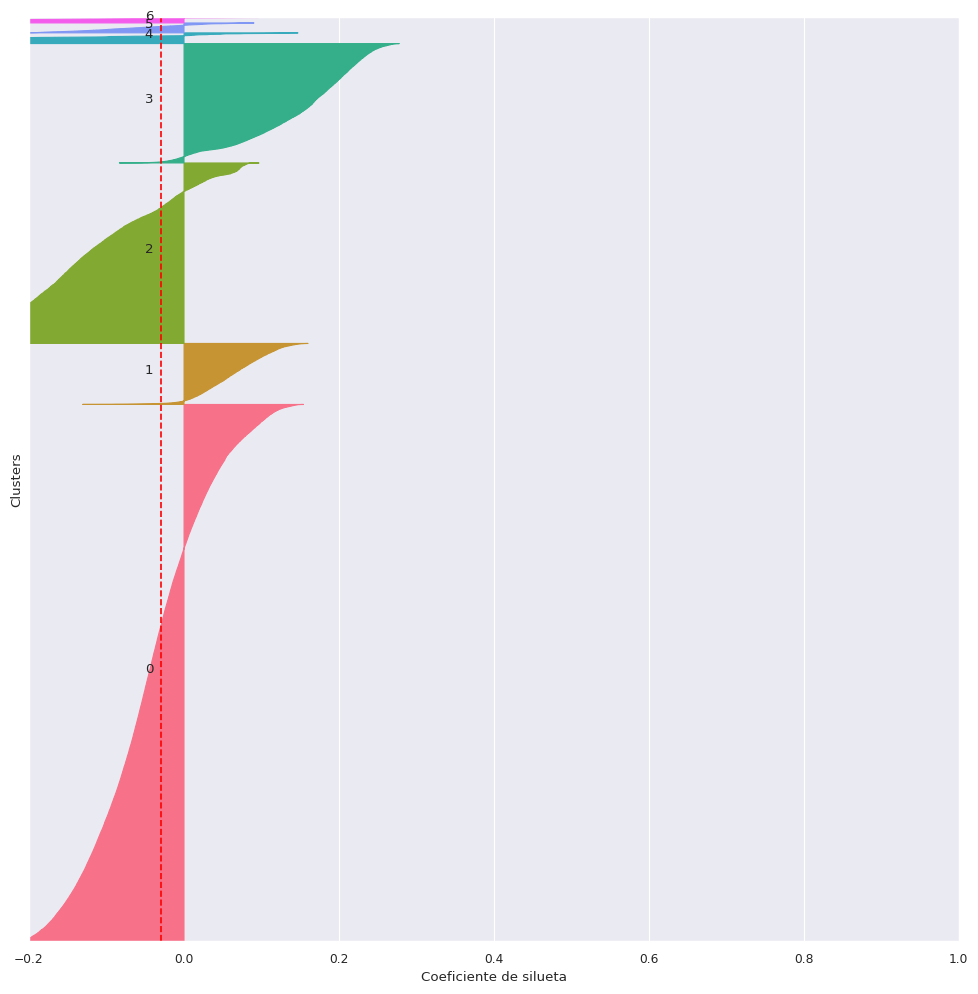

In [ ]:
seed = 111
k = 7

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

#### Construcción de gráficas

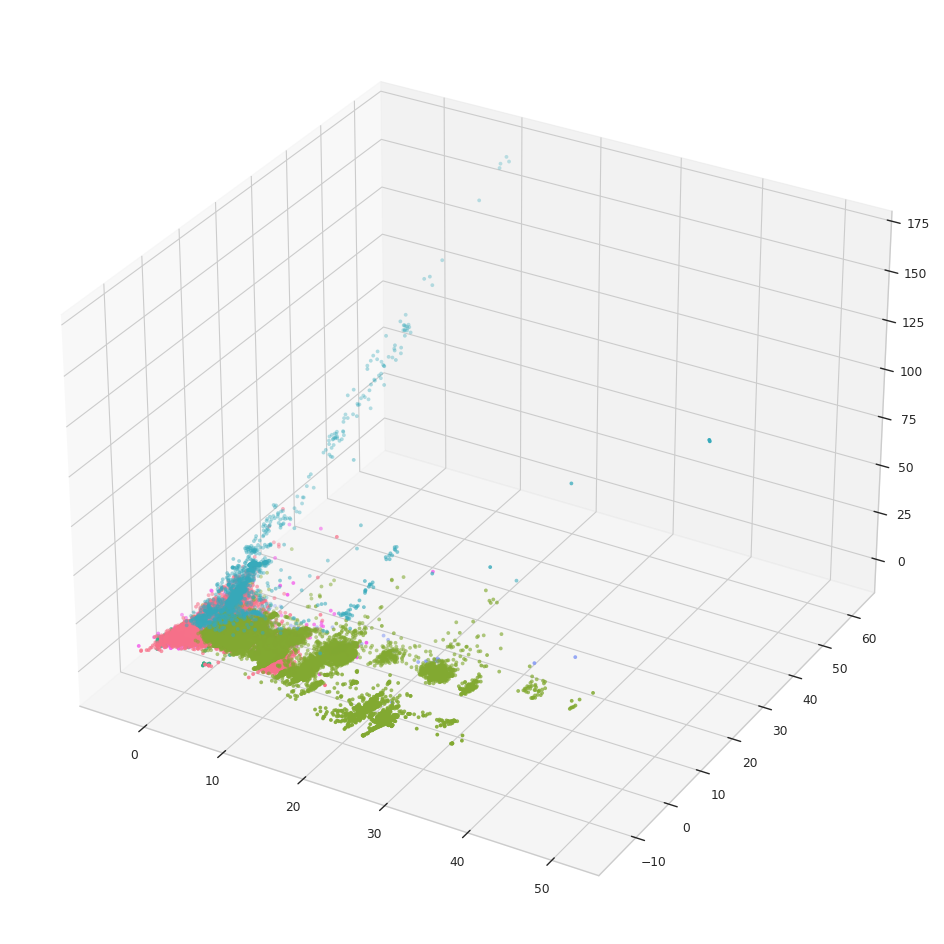

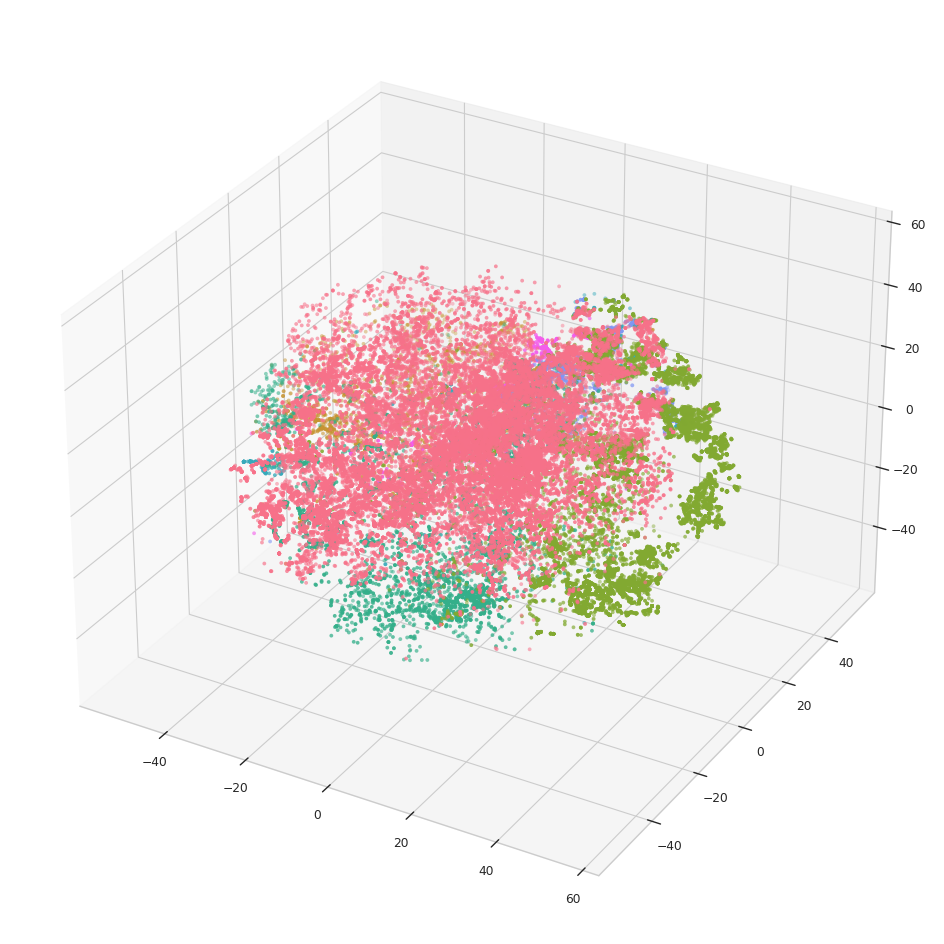

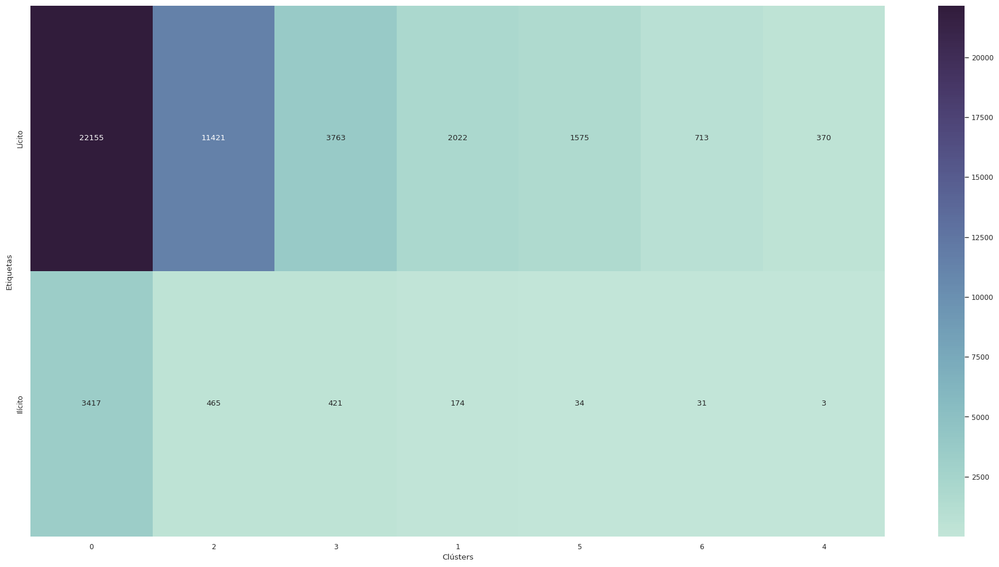

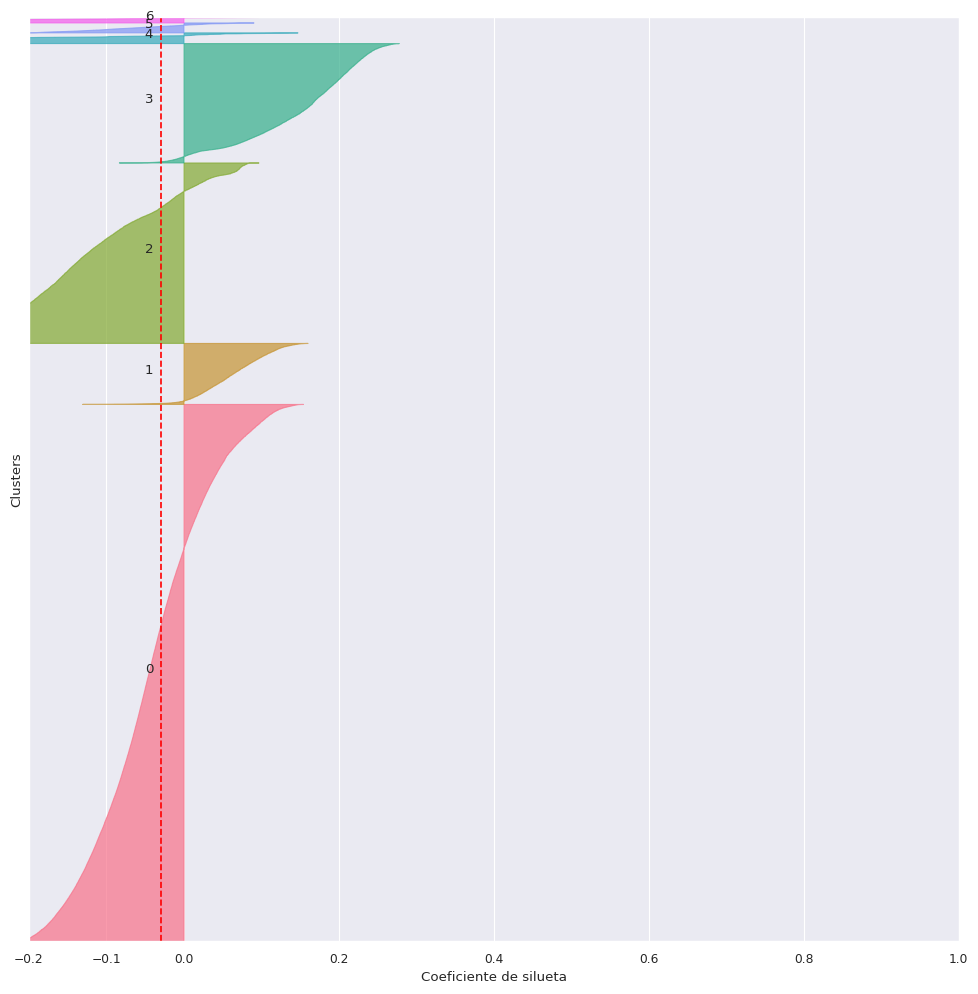

In [ ]:
seed = 111
k = 7

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='all_features', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='all_features', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='all_features', seed=seed)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

### $K=33$

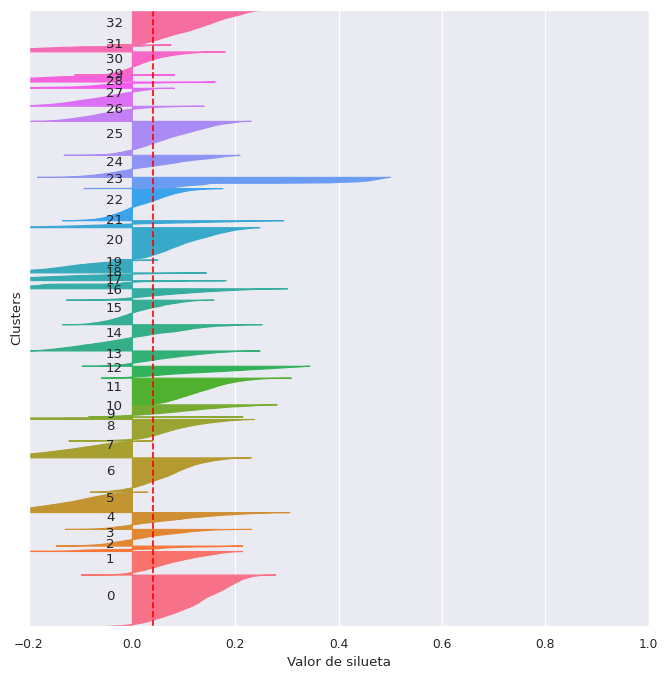

In [14]:
seed = 335
k = 33

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
#plot_contingency_matrix(cluster_labels, k, save=True, prefix='all_features', seed=seed, cbar=False, annot=False)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

#### Pruebas con distintas semillas aleatorias

In [ ]:
k = 33

for j in tqdm(range(1,500)):
    kmeans = MiniBatchKMeans(n_clusters=k, random_state=j, **kmeans_params)
    cluster_labels = kmeans.fit_predict(all_features)
    max_ilicit_cluster = np.unique(cluster_labels[labels==1], return_counts=True)[1].max()
    if  max_ilicit_cluster > 2000:
        print(f'Semilla {j} con resultados buenos: {max_ilicit_cluster}')

  0%|          | 0/499 [00:00<?, ?it/s]

Semilla 1 con resultados buenos: 2106
Semilla 4 con resultados buenos: 2224
Semilla 25 con resultados buenos: 2034
Semilla 29 con resultados buenos: 2025
Semilla 34 con resultados buenos: 2025
Semilla 39 con resultados buenos: 2088
Semilla 70 con resultados buenos: 2041
Semilla 71 con resultados buenos: 2103
Semilla 80 con resultados buenos: 2340
Semilla 85 con resultados buenos: 2290
Semilla 96 con resultados buenos: 2152
Semilla 98 con resultados buenos: 2287
Semilla 119 con resultados buenos: 2174
Semilla 122 con resultados buenos: 2083
Semilla 126 con resultados buenos: 2203
Semilla 141 con resultados buenos: 2101
Semilla 147 con resultados buenos: 2214
Semilla 150 con resultados buenos: 2375
Semilla 160 con resultados buenos: 2123
Semilla 162 con resultados buenos: 2406
Semilla 167 con resultados buenos: 2252
Semilla 182 con resultados buenos: 2085
Semilla 190 con resultados buenos: 2120
Semilla 195 con resultados buenos: 2023
Semilla 199 con resultados buenos: 2076
Semilla 200 co

#### Construcción de gráficas

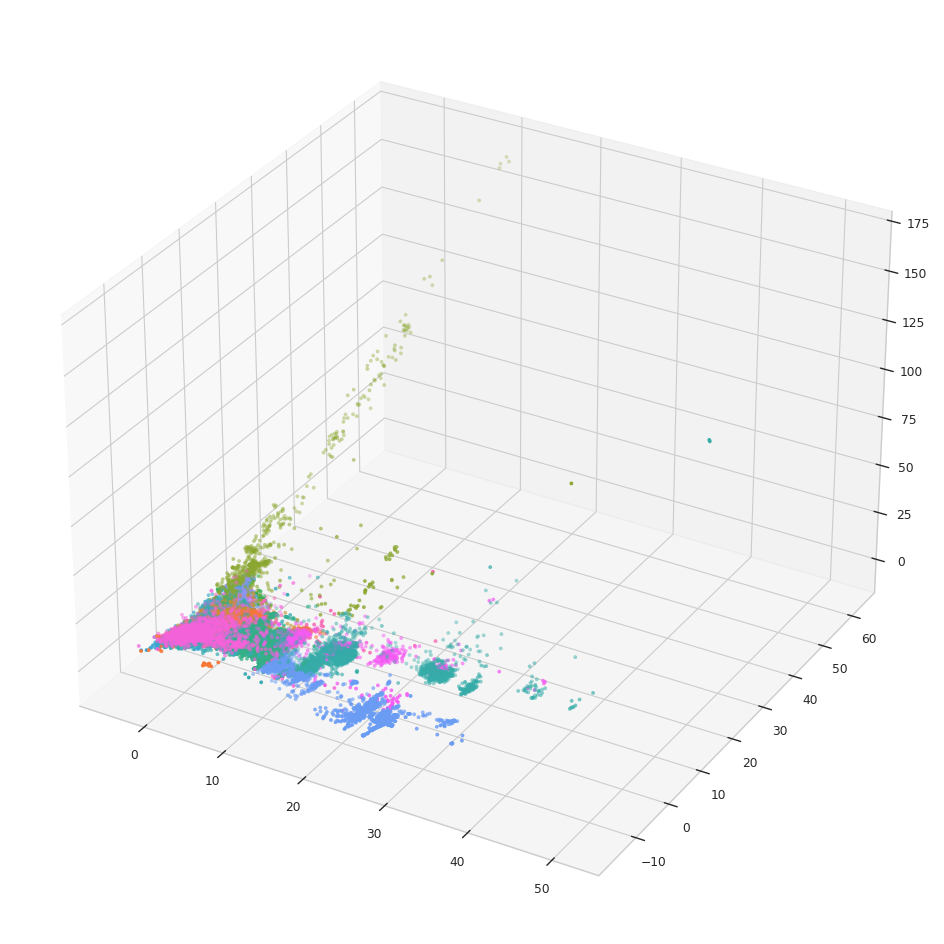

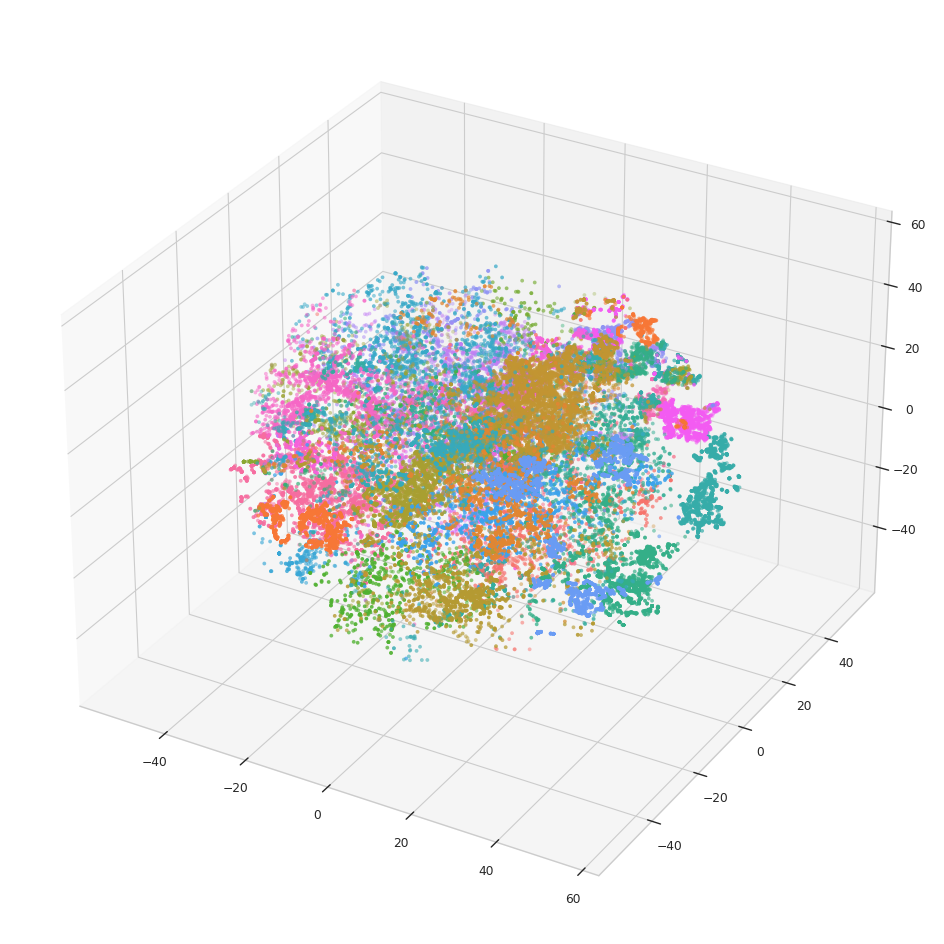

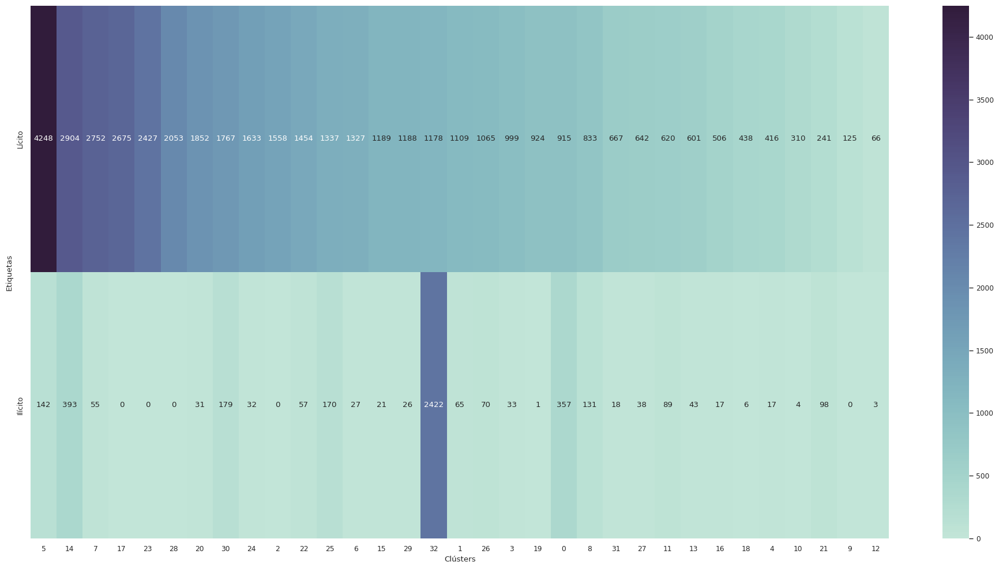

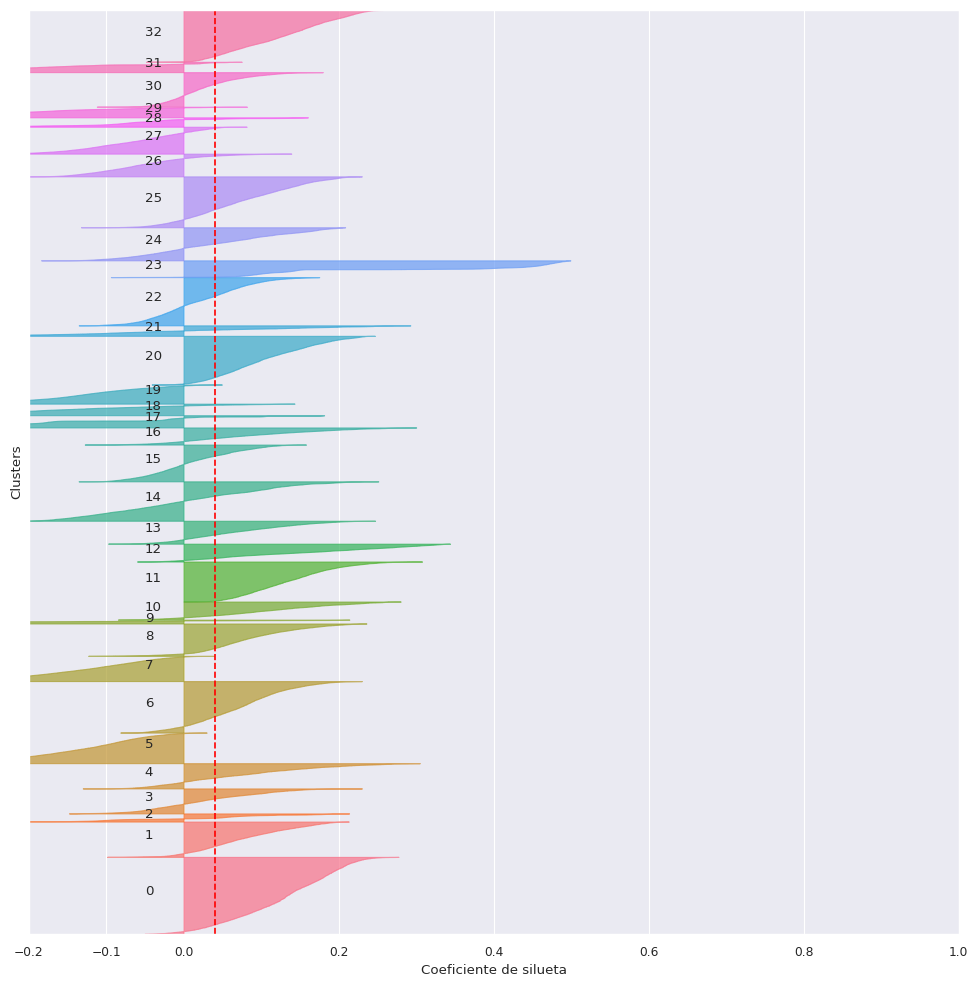

In [ ]:
seed = 335
k = 33

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='all_features', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='all_features', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='all_features', seed=seed)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

### $K=49$

#### Pruebas con distintas semillas aleatorias

In [ ]:
k = 49

for j in tqdm(range(1,500)):
    kmeans = MiniBatchKMeans(n_clusters=k, random_state=j, **kmeans_params)
    cluster_labels = kmeans.fit_predict(all_features)
    max_ilicit_cluster = np.unique(cluster_labels[labels==1], return_counts=True)[1].max()
    if  max_ilicit_cluster > 1500:
        print(f'Semilla {j} con resultados buenos: {max_ilicit_cluster}')

#### Construcción de gráficas

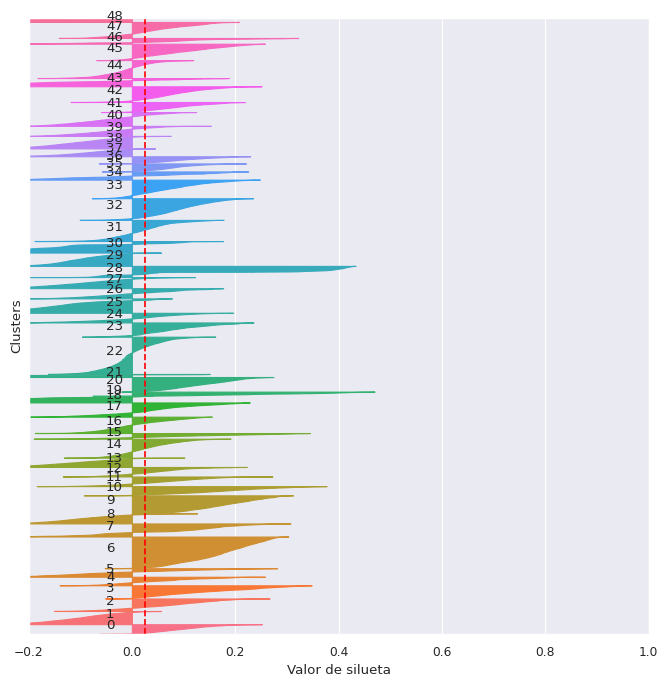

In [15]:
seed = 65
k = 49

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
#plot_contingency_matrix(cluster_labels, k, save=True, prefix='all_features', seed=seed, cbar=False, annot=False)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

#### Construcción de gráficas

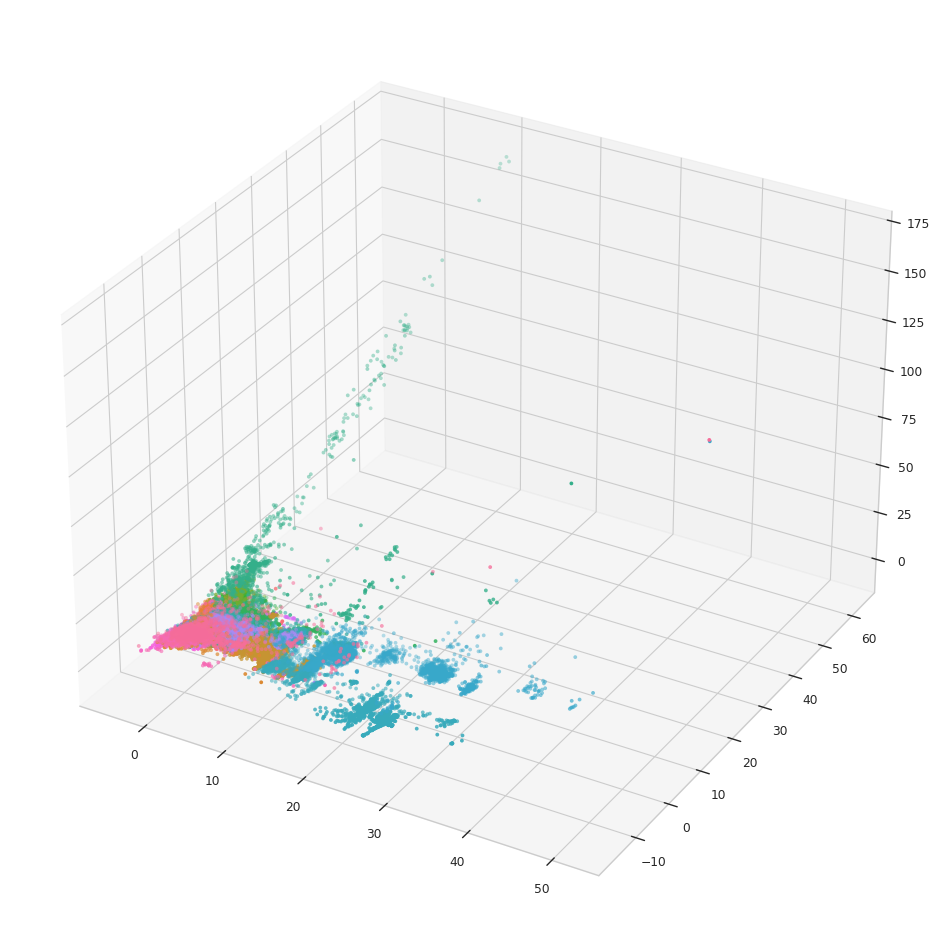

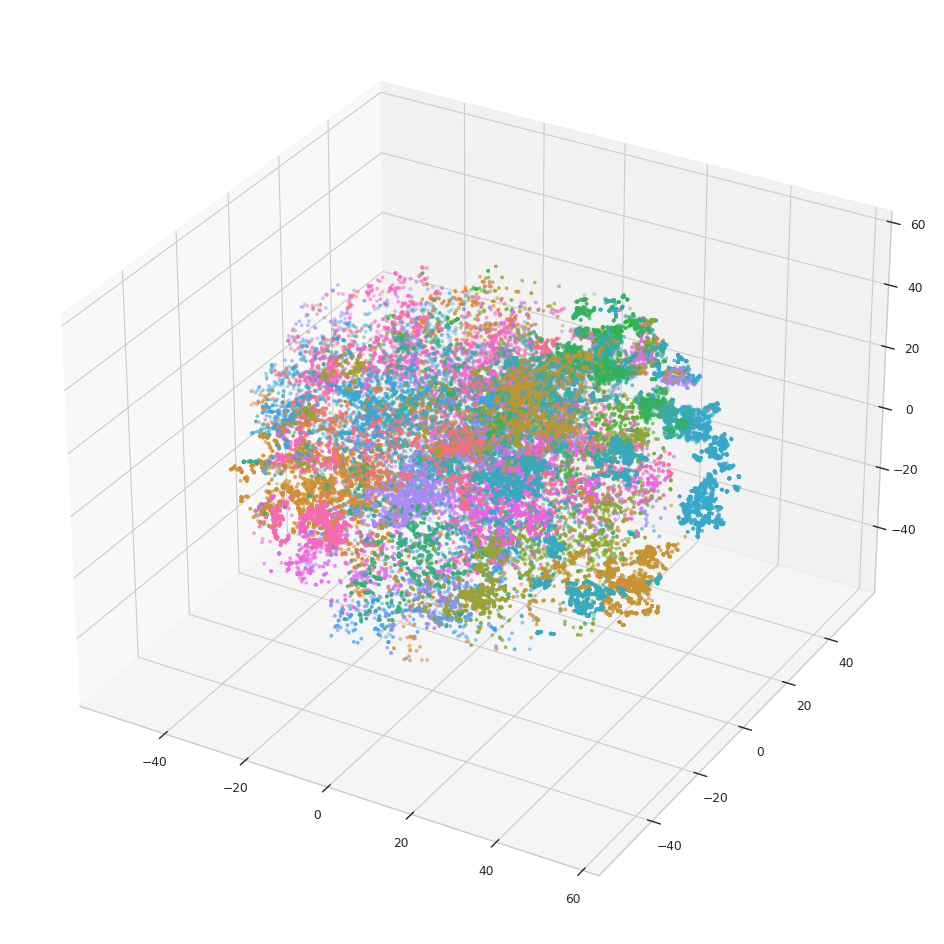

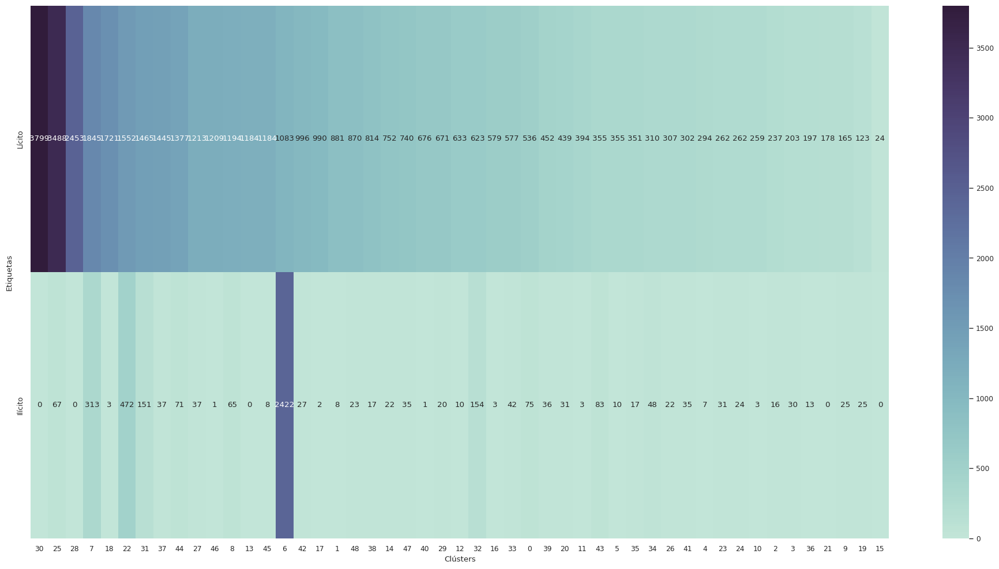

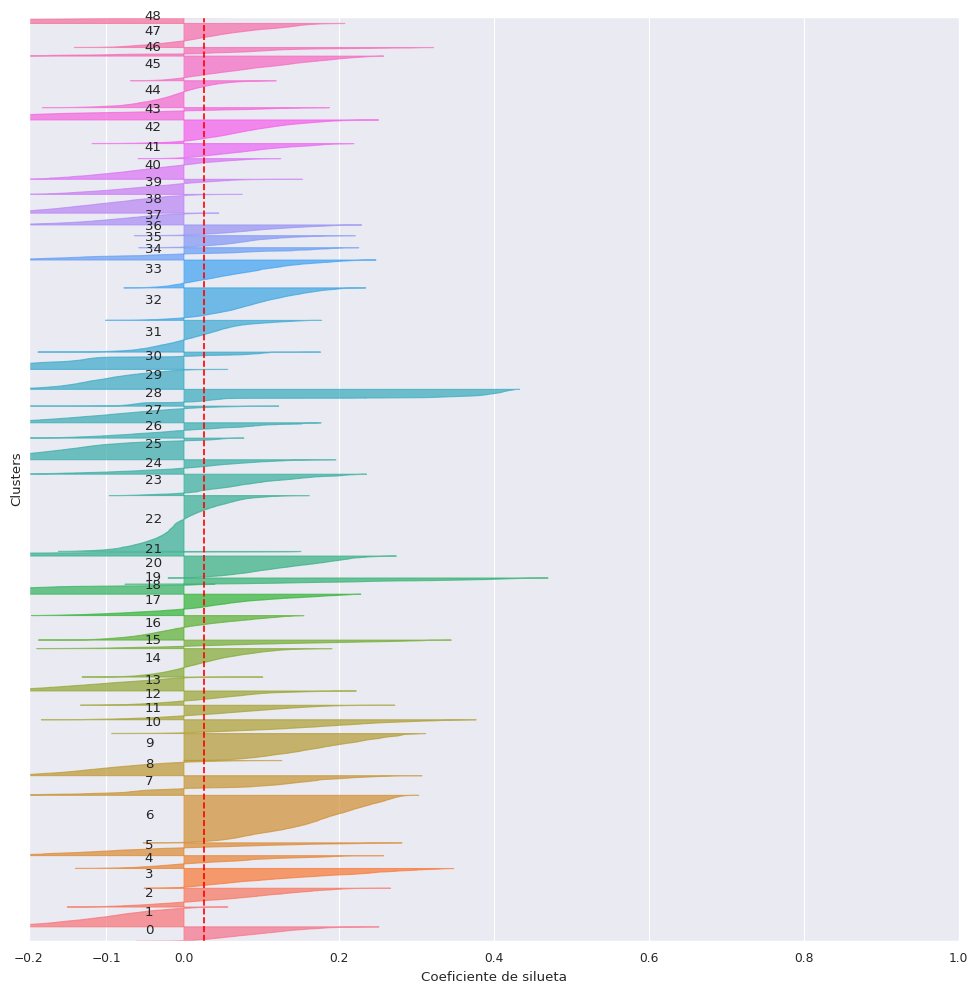

In [ ]:
seed = 65
k = 49

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(all_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='all_features', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='all_features', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='all_features', seed=seed)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='all_features', seed=seed)

## ~**K-means sobre features reducidas con PCA**~

No hay mejora


### Reducción de features

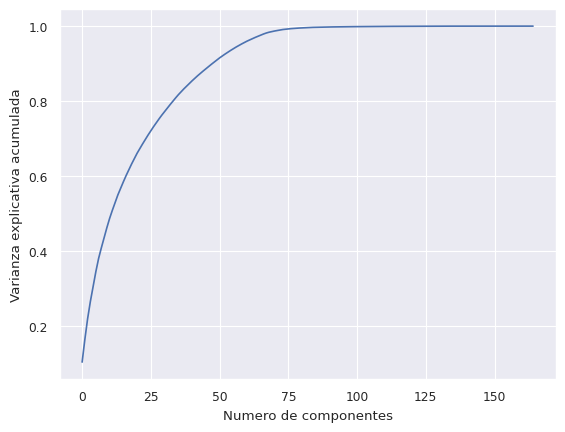

In [ ]:
pca.explained_variance_ratio_
expl = pca.explained_variance_ratio_

plt.plot(np.cumsum(expl))
plt.xlabel('Numero de componentes')
plt.ylabel('Varianza explicativa acumulada')
plt.show()

In [ ]:
pca75_features = pca_reduced_features[:,:75]
pca50_features = pca_reduced_features[:,:50]

### $K=7$

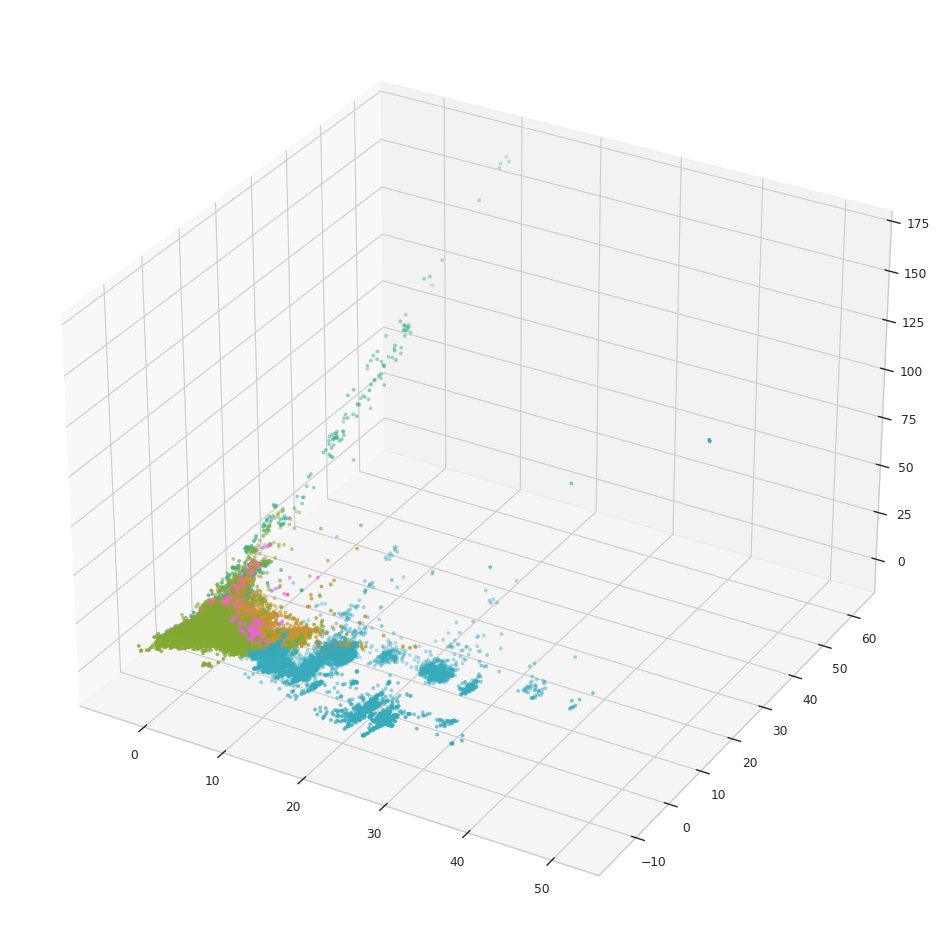

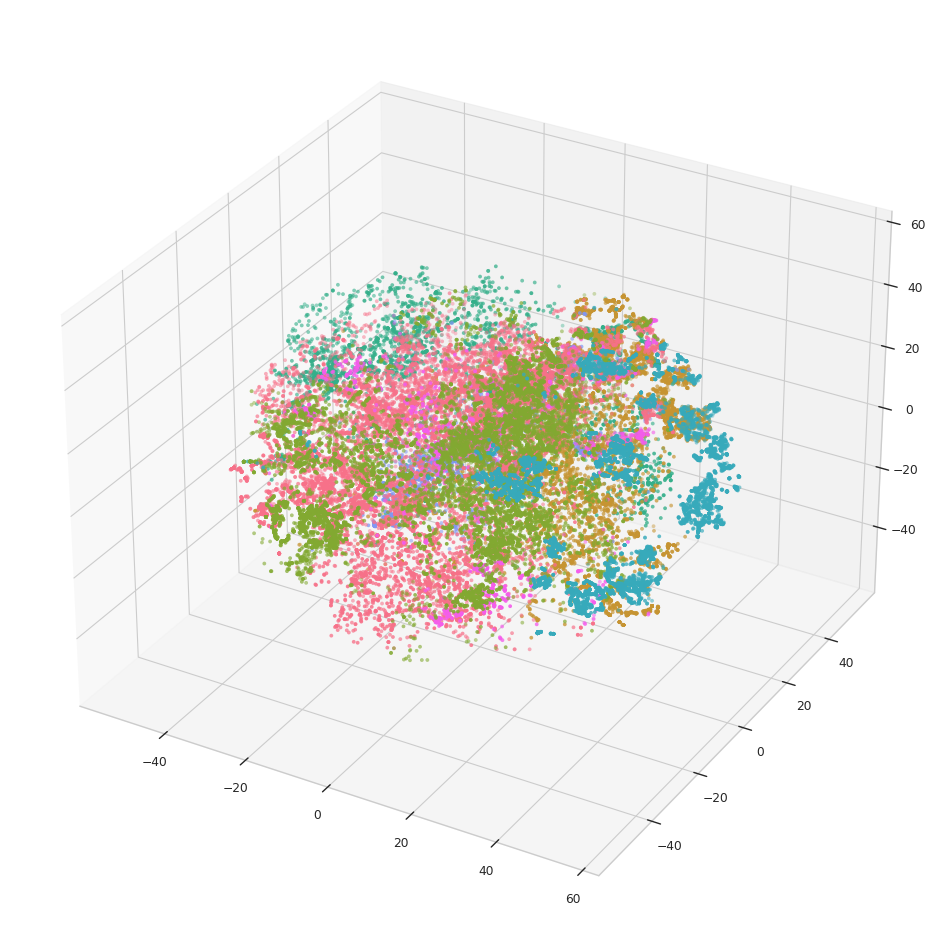

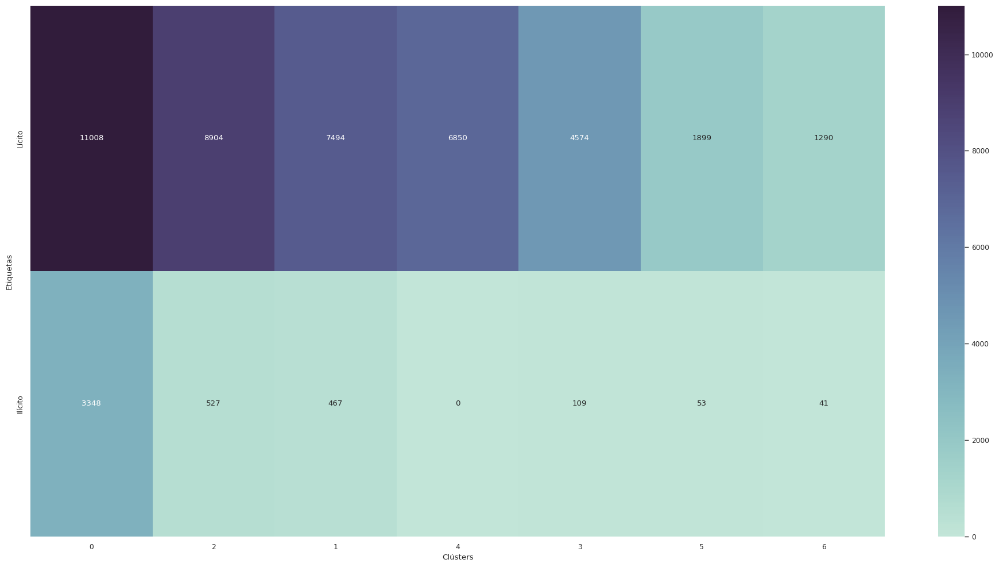

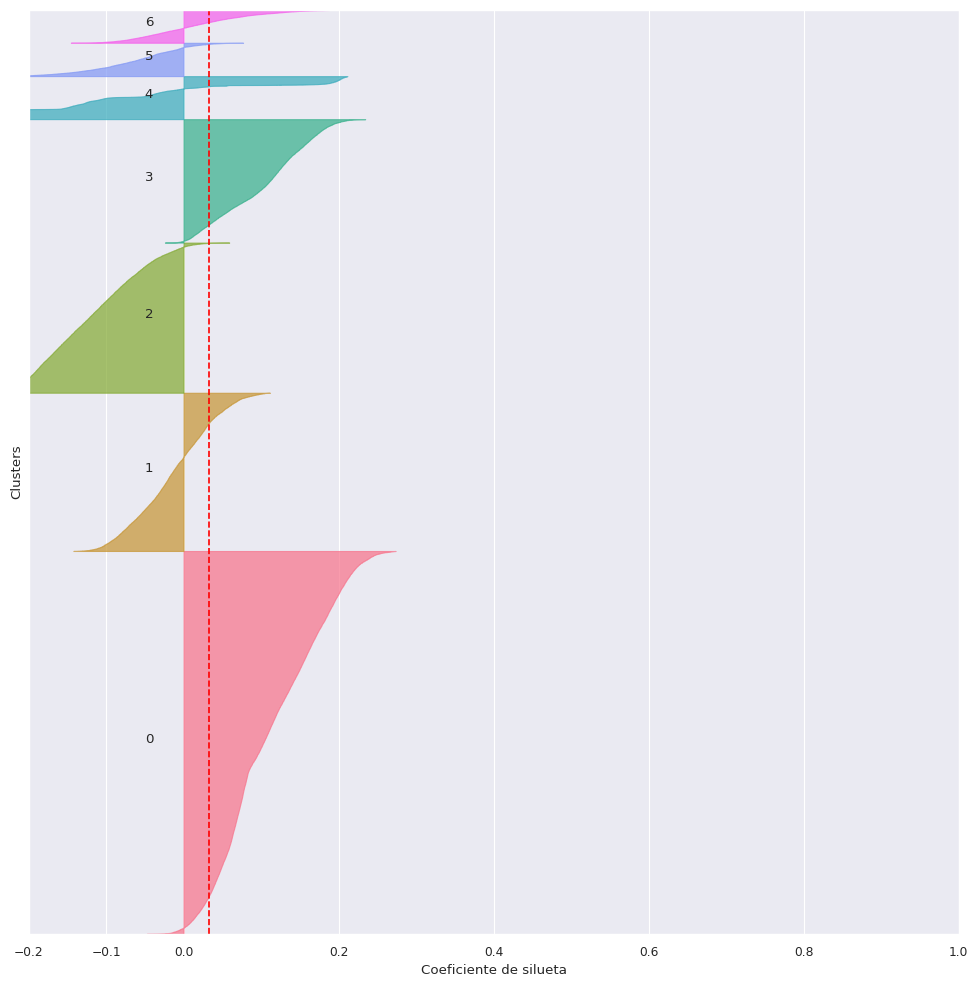

In [ ]:
seed = 291
k = 7

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(pca75_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='pca75_reduced', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='pca75_reduced', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)
plot_silhoutte_diagram(all_features, cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)

### $K=33$

#### Pruebas con distintas semillas aleatorias

In [ ]:
k = 33

for j in tqdm(range(1,500)):
    kmeans = MiniBatchKMeans(n_clusters=k, random_state=j, **kmeans_params)
    cluster_labels = kmeans.fit_predict(pca75_features)
    max_ilicit_cluster = np.unique(cluster_labels[labels==1], return_counts=True)[1].max()
    if  max_ilicit_cluster > 2200:
        print(f'Semilla {j} con resultados buenos: {max_ilicit_cluster}')

  0%|          | 0/499 [00:00<?, ?it/s]

Semilla 7 con resultados buenos: 2272
Semilla 11 con resultados buenos: 2285
Semilla 29 con resultados buenos: 2214
Semilla 44 con resultados buenos: 2327
Semilla 54 con resultados buenos: 2250
Semilla 66 con resultados buenos: 2211
Semilla 76 con resultados buenos: 2241
Semilla 87 con resultados buenos: 2234
Semilla 88 con resultados buenos: 2248
Semilla 127 con resultados buenos: 2228
Semilla 182 con resultados buenos: 2211
Semilla 185 con resultados buenos: 2268
Semilla 187 con resultados buenos: 2241
Semilla 244 con resultados buenos: 2210
Semilla 249 con resultados buenos: 2207
Semilla 256 con resultados buenos: 2251
Semilla 261 con resultados buenos: 2293
Semilla 289 con resultados buenos: 2254
Semilla 296 con resultados buenos: 2251
Semilla 297 con resultados buenos: 2278
Semilla 381 con resultados buenos: 2261
Semilla 403 con resultados buenos: 2486
Semilla 471 con resultados buenos: 2433
Semilla 485 con resultados buenos: 2250


#### Construcción de gráficas

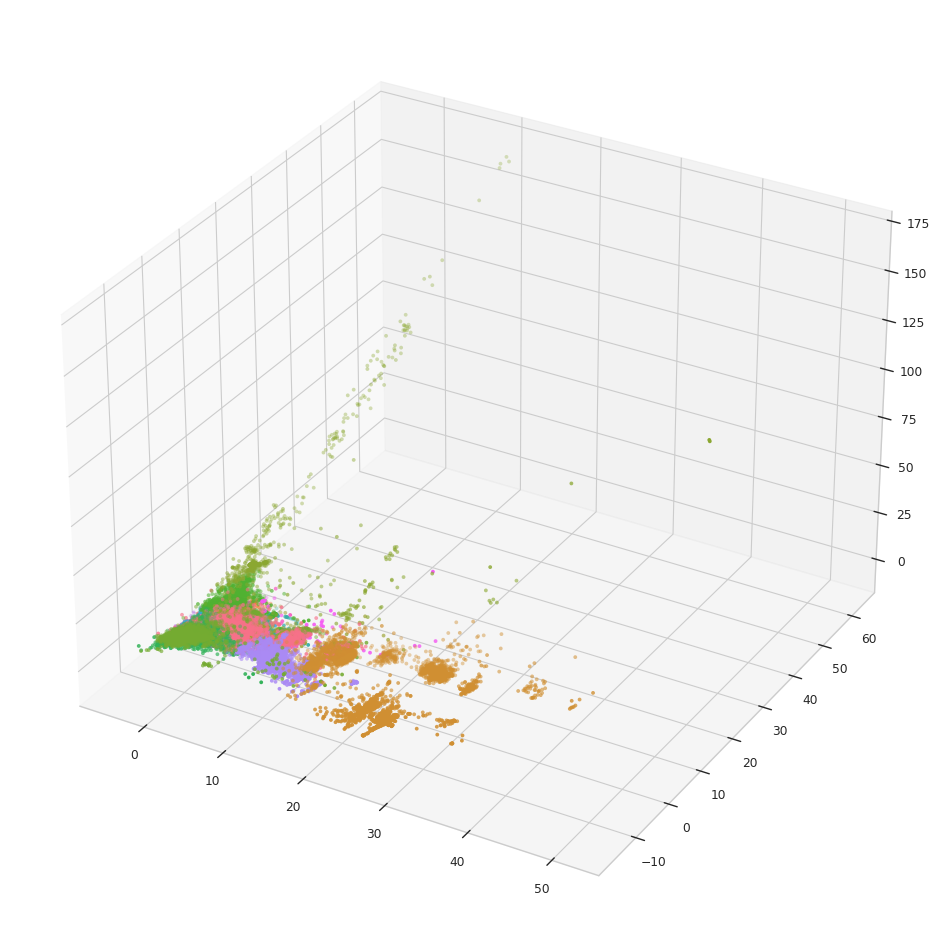

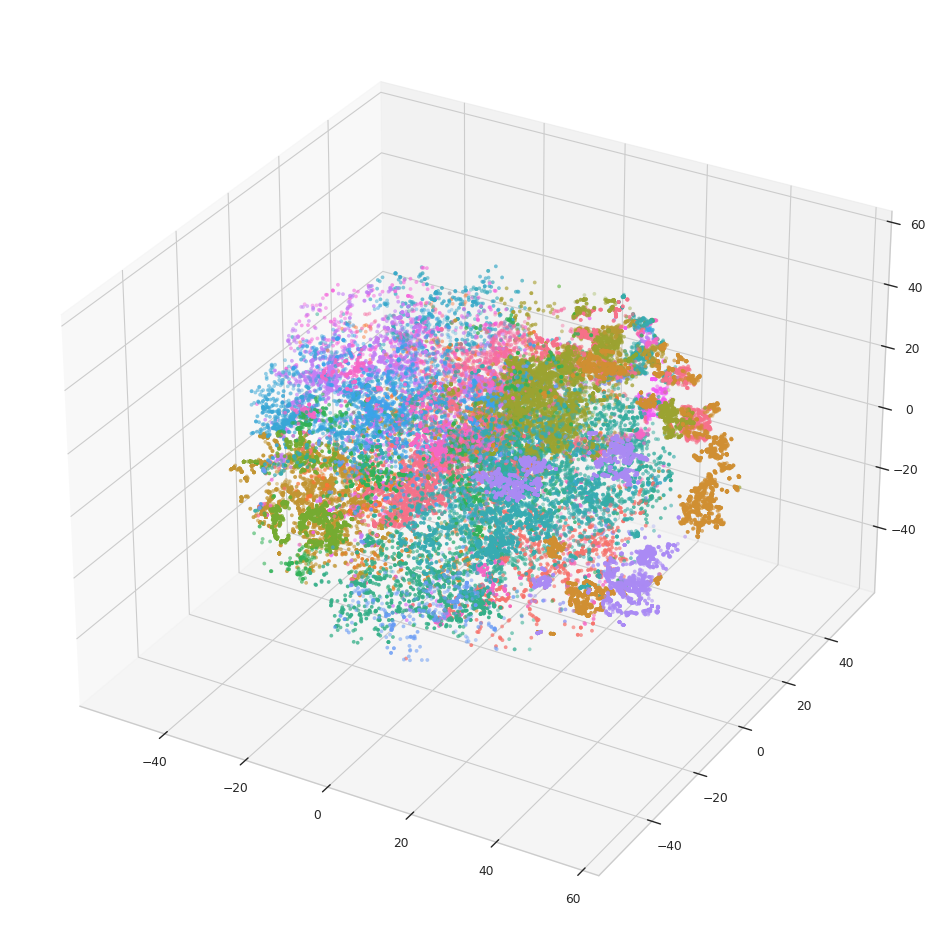

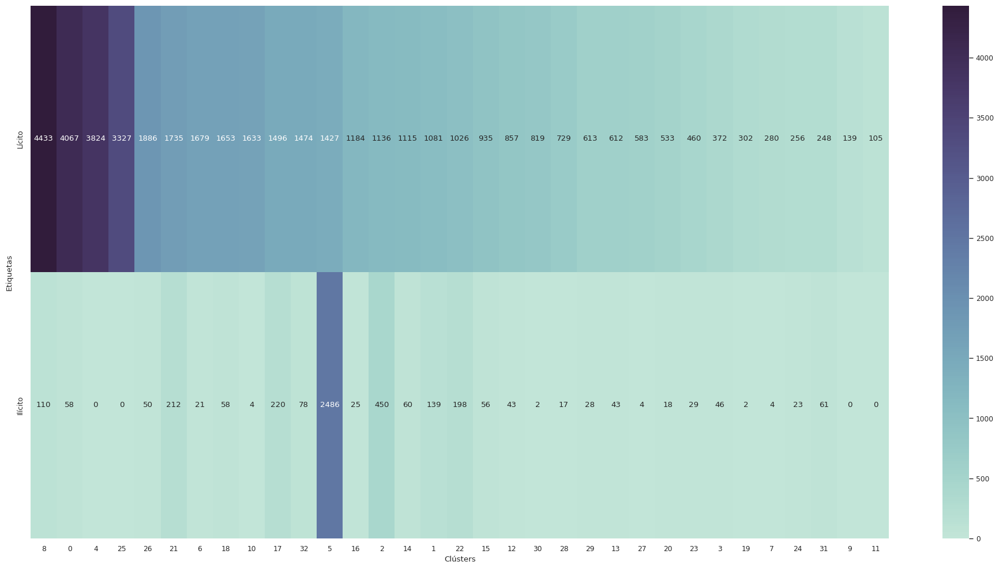

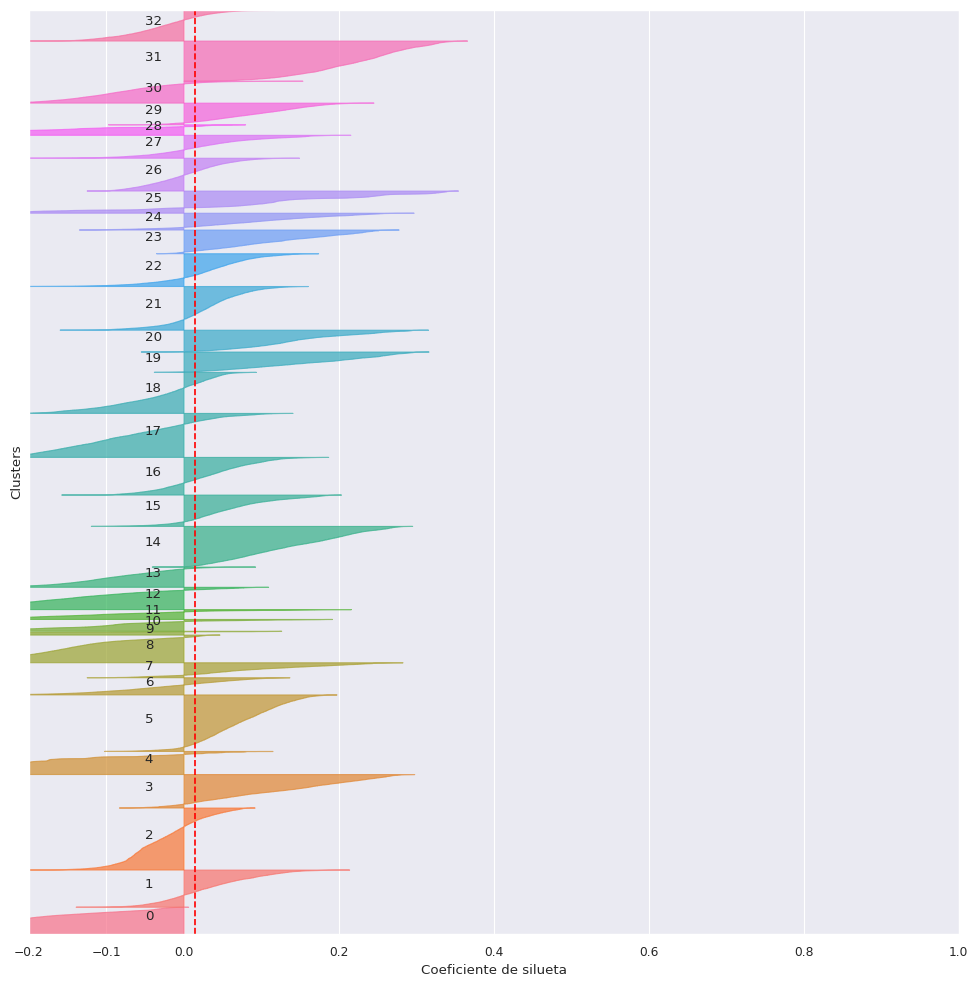

In [ ]:
seed = 403
k = 33

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(pca75_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='pca75_reduced', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='pca75_reduced', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)
plot_silhoutte_diagram(pca75_features, cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)

### $K=49$

#### Pruebas con distintas semillas aleatorias

In [ ]:
k = 49

for j in tqdm(range(1,500)):
    kmeans = MiniBatchKMeans(n_clusters=k, random_state=j, **kmeans_params)
    cluster_labels = kmeans.fit_predict(pca75_features)
    max_ilicit_cluster = np.unique(cluster_labels[labels==1], return_counts=True)[1].max()
    if  max_ilicit_cluster > 2000:
        print(f'Semilla {j} con resultados buenos: {max_ilicit_cluster}')

  0%|          | 0/499 [00:00<?, ?it/s]

Semilla 9 con resultados buenos: 2011
Semilla 48 con resultados buenos: 2152
Semilla 65 con resultados buenos: 2270
Semilla 70 con resultados buenos: 2032
Semilla 108 con resultados buenos: 2298
Semilla 117 con resultados buenos: 2033
Semilla 146 con resultados buenos: 2015
Semilla 159 con resultados buenos: 2109
Semilla 167 con resultados buenos: 2260
Semilla 169 con resultados buenos: 2114
Semilla 176 con resultados buenos: 2096
Semilla 197 con resultados buenos: 2021
Semilla 201 con resultados buenos: 2212
Semilla 219 con resultados buenos: 2071
Semilla 249 con resultados buenos: 2056
Semilla 264 con resultados buenos: 2033
Semilla 267 con resultados buenos: 2100
Semilla 281 con resultados buenos: 2170
Semilla 284 con resultados buenos: 2029
Semilla 285 con resultados buenos: 2036
Semilla 304 con resultados buenos: 2321
Semilla 308 con resultados buenos: 2125
Semilla 364 con resultados buenos: 2161
Semilla 375 con resultados buenos: 2033
Semilla 402 con resultados buenos: 2113
Semil

#### Construcción de gráficas

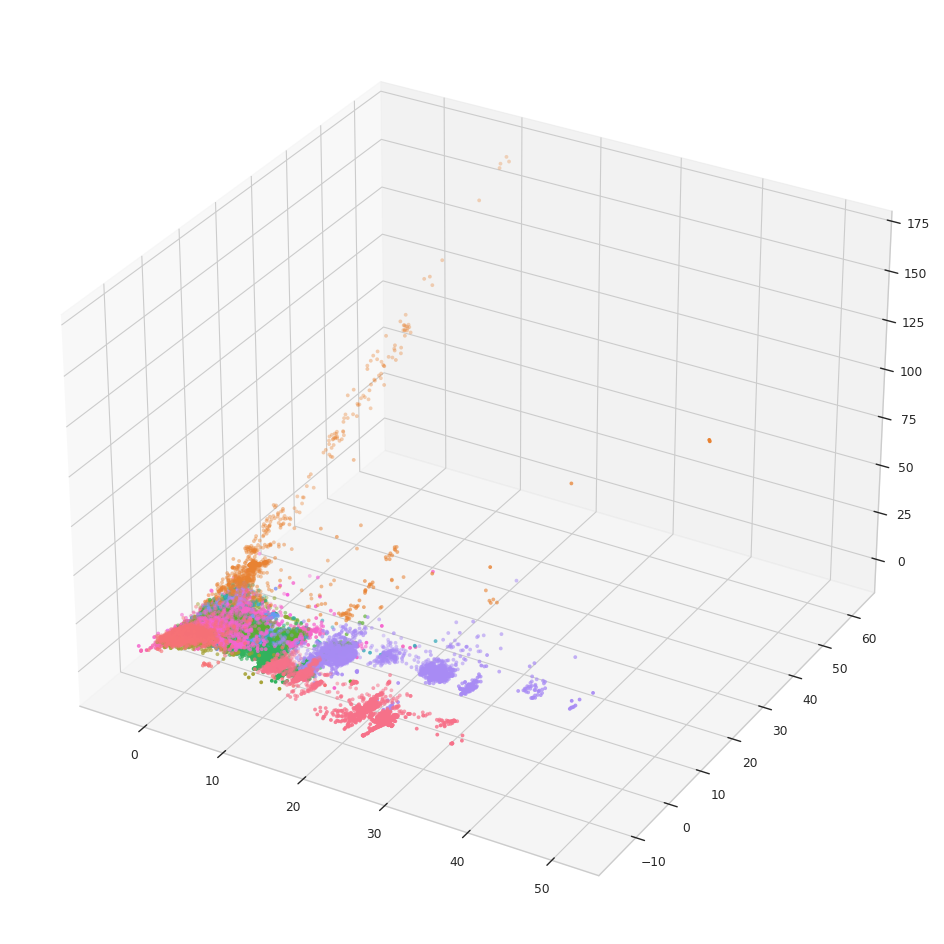

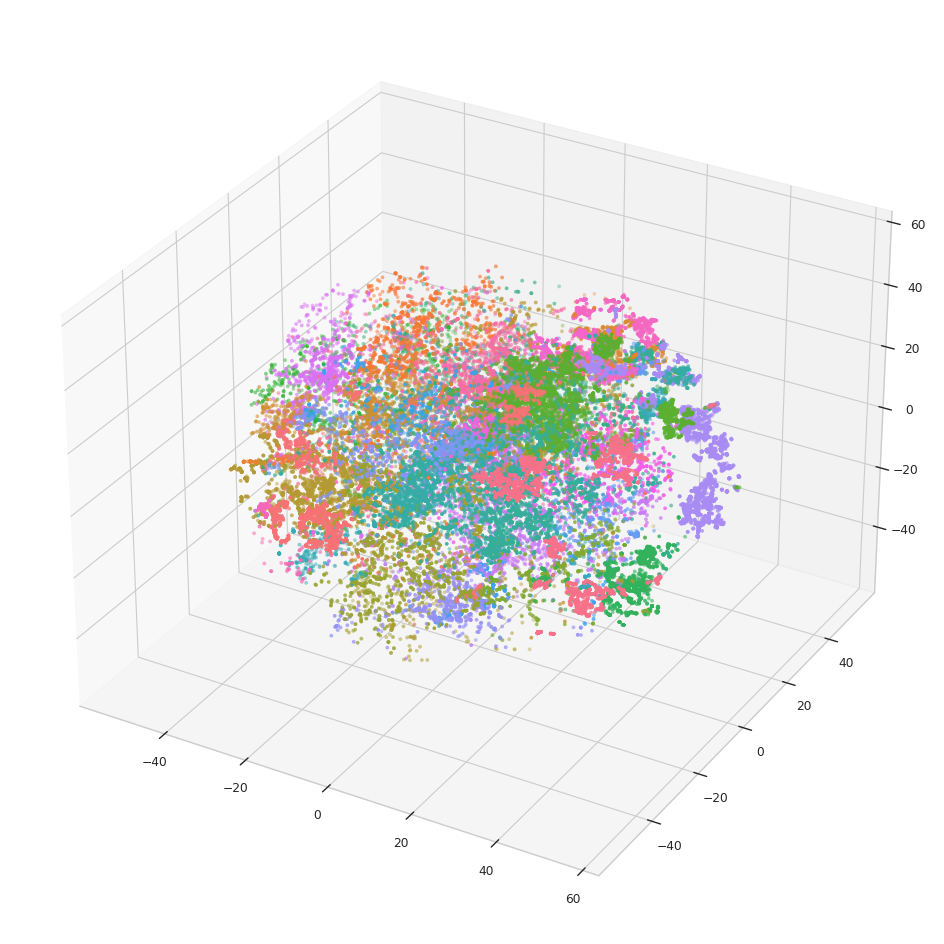

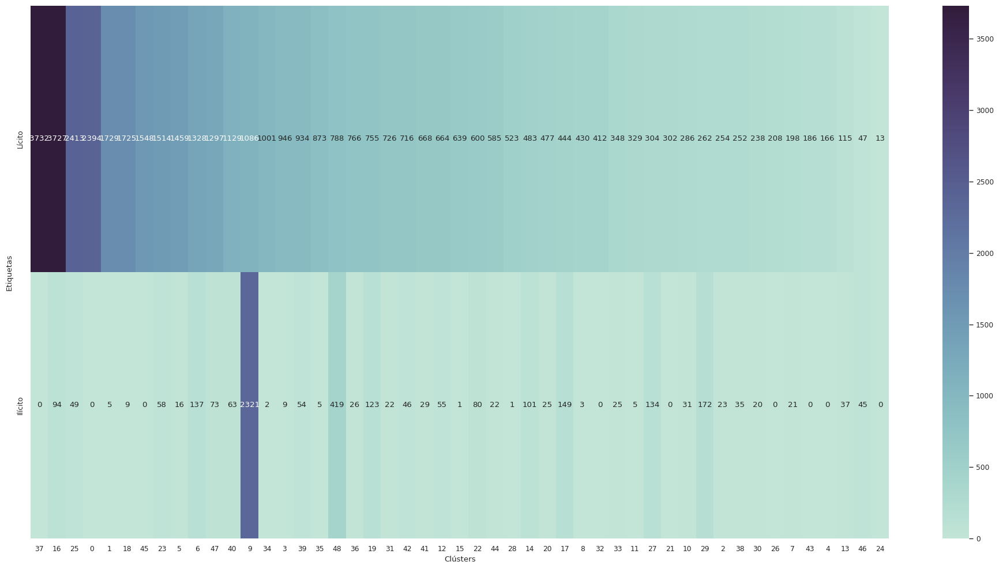

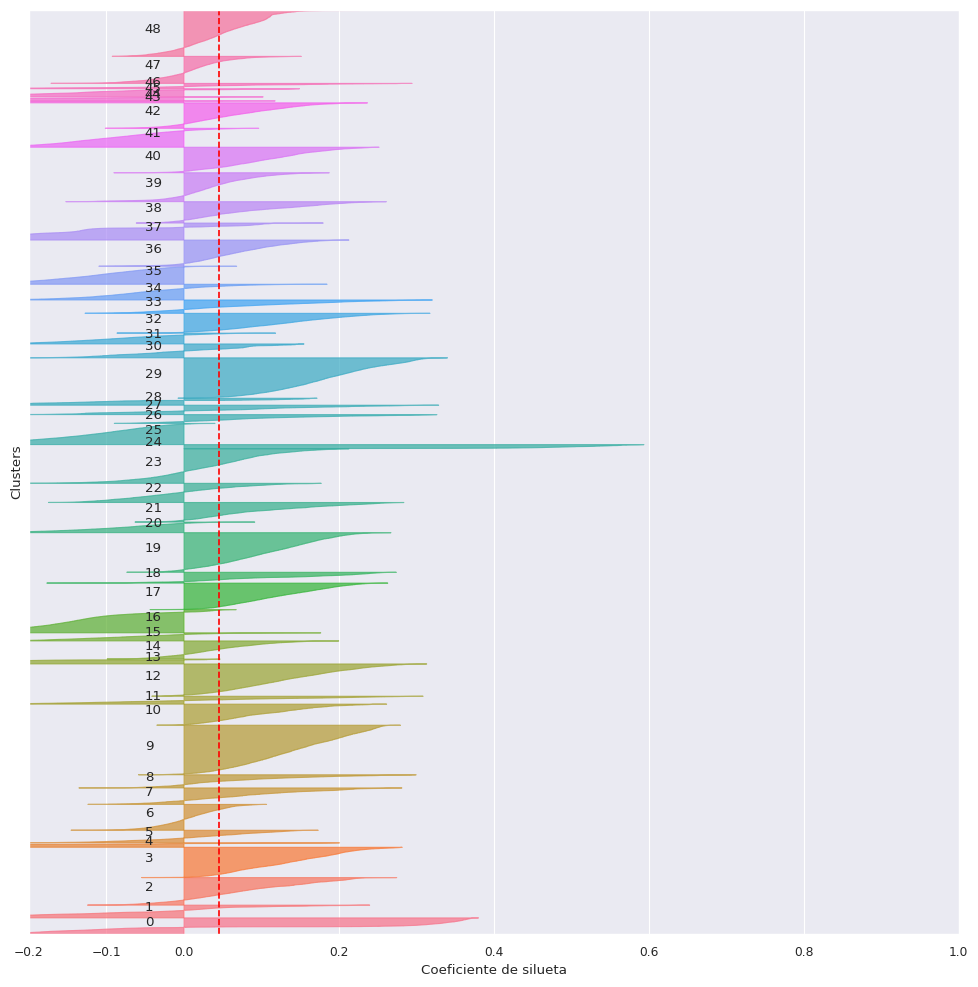

In [ ]:
seed = 304
k = 49

kmeans = MiniBatchKMeans(n_clusters=k, random_state=seed, **kmeans_params)
cluster_labels = kmeans.fit_predict(pca75_features)
plot_clusters_visualization(cluster_labels, k, method='PCA', save=True, prefix='pca75_reduced', seed=seed, only_labelled=False)
plot_clusters_visualization(cluster_labels, k, method='TSNE', save=True, prefix='pca75_reduced', seed=seed, only_labelled=True)
plot_contingency_matrix(cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)
plot_silhoutte_diagram(pca75_features, cluster_labels, k, save=True, prefix='pca75_reduced', seed=seed)